In [1]:
import torch
import torchvision
import pytorch_lightning as pl
from torch.utils.data import DataLoader
from era_data import TabletPeriodDataset, get_IDS
from collections import Counter
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import pandas as pd  
from VAE_model_tablets import VAE
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import multiprocessing
from tqdm import tqdm

In [2]:
# IMG_DIR = 'output/images'
RUN_NAME_SUFFIX = '-masked' # ''
IMG_DIR = 'output/images_preprocessed'
LR = 5e-5
EPOCHS = 50
BATCH_SIZE = 16
SUFFIX = '-resnet50'

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
IDS = get_IDS(IMG_DIR=IMG_DIR)
len(IDS)

97640

In [5]:
# VERSION_NAME = f'period_clf_bs{BATCH_SIZE}_lr{LR}_{EPOCHS}epochs{SUFFIX}-{len(IDS)}_samples{RUN_NAME_SUFFIX}_blurvae-conv-Sept20'
VERSION_NAME = f'period_clf_bs{BATCH_SIZE}_lr{LR}_15epochs{SUFFIX}-{len(IDS)}_samples{RUN_NAME_SUFFIX}_blurvae-conv'
VERSION_NAME

'period_clf_bs16_lr5e-05_15epochs-resnet50-97640_samples-masked_blurvae-conv'

In [7]:
# VERNAME = 'period_clf_bs16_lr5e-05_15epochs-resnet50-97640_samples-masked-Sept_19_blur-early_stopping-1'
VERNAME = 'period_clf_bs16_lr5e-05_15epochs-resnet50-97640_samples-masked_blur_vae'
train_ids = pd.read_csv(f'output/clf_ids/period-train-{VERNAME}.csv', header=None)[0].astype(str)
test_ids = pd.read_csv(f'output/clf_ids/period-test-{VERNAME}.csv', header=None)[0].astype(str)

In [8]:
ds_train = TabletPeriodDataset(IDS=train_ids, IMG_DIR=IMG_DIR, mask=True)
ds_test = TabletPeriodDataset(IDS=test_ids, IMG_DIR=IMG_DIR, mask=True)

Filtering 97640 IDS down to provided 97140...
Filtering 97640 IDS down to provided 500...


In [9]:
import numpy as np
from PIL import Image

def collate_fn(batch):
    # Unsqueeze the matrix (the first element of each tuple)
    
    unsqueezed_data = [torch.from_numpy(np.array(Image.fromarray(sample[0]).resize((178, 218), Image.NEAREST))).unsqueeze(0).unsqueeze(0) for sample in batch]
    labels = torch.from_numpy(np.array([sample[1] for sample in batch]))

    # Concatenate the unsqueezed matrices into a new tensor
    unsqueezed_batch_data = torch.cat(unsqueezed_data, dim=0)

    return unsqueezed_batch_data, labels

In [10]:
dl_train = DataLoader(ds_train, batch_size=7, shuffle=True, num_workers=4, collate_fn = collate_fn, pin_memory=True)
dl_test = DataLoader(ds_test, batch_size=7, shuffle=False, num_workers=4, collate_fn = collate_fn, pin_memory=True)

In [11]:
for batch in dl_train:
    x, y = batch
    print(x.shape,y.shape)
    break

torch.Size([7, 1, 218, 178]) torch.Size([7])


In [12]:
# import warnings
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor
logger = pl.loggers.TensorBoardLogger(
    save_dir='.',
    name='lightning_logs',
    version=VERSION_NAME
)

In [13]:
lr_monitor = LearningRateMonitor(logging_interval='step')

In [ ]:
model = VAE(image_channels=1, z_dim=16, lr =1e-5 ) # z_dim = size of embeddings bottleneck
trainer = pl.Trainer(accelerator='gpu', callbacks=[lr_monitor], max_epochs = EPOCHS, devices='auto', 
                     val_check_interval=0.2, logger=logger,) # train 
trainer.fit(model, dl_train, dl_test) 

/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/kapond/.conda/envs/dani_torch/lib/python3.11/s ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/kapond/.conda/envs/dani_torch/lib/python3.11/s ...
  rank_zero_warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type   

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

tensor(58303.8555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(47135.6836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(49310.4961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(42789.4336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(34753.4805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(43898.5781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(34571.1523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(34152.9102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30327.7812, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33963.2031, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31815.0957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31566.9785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33161.5859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30151.9434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33006.9844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29039.0801, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33656.1211, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(29777.6094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25465.0254, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27297.4336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25813.3770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25107.0469, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24648.2793, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28997.1523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27697.3203, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27121.8496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25988.4941, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28614.3066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25022.3223, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26932.8359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25204.5078, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27418.6934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24069.7832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29800.5762, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(24347.2344, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25139.7695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28521.2090, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23765.6875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25277.9766, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24808.3984, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24920.5059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24690.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26495.4316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26171.5156, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24332.5645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24490.2227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26131.8262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27853.8789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25308.5371, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26095.0898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27761.2422, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(24174.9414, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24530.2910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24272.5020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23033.1973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26550.7266, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23895.2109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22485.6055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25105.1172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24202.4590, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24261.9453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23497.4727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21925.2754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23954.9648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25555.8379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27305.4727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25012.0352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23991.5332, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(22289.8789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27084.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24310.0820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25318.0645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21133.6191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23190.9766, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23397.5293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25145.8281, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23325.1094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23530.4062, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23939.5312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21720.9004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24107.0938, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25347.8867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21737.7246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23766.3984, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24566.1270, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(25279.9355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21266.4883, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22961.3301, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24680.0527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22366.3398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22538.0820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24006.7891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25698.4219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22208.3945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24290.9199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23764.0977, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22204.8594, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21555.2520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23195.2676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20845.1895, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24701.5996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20822.9258, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(20730.6016, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20708.0391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22237.3984, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24529.3750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22970.2539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20028.5020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20875.0254, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21057.4551, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23554.9336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24619.8477, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22580.6152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21958.5859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24884.8438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22913.7852, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23308.0352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21605.9863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20467.0234, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(19690.0098, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21601.5859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22764.8027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21480.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23308.5391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20136.6250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25700.5039, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21474.2676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23048.6230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23606.7500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21921.5312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18520.5352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21610.4746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19902.2695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21969.8281, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23723.7754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22033.2520, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(22160.5840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21785.0234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21911.9082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20725.2969, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20287.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22212.0273, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23574.0586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20124.7695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22667.2109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20452.9395, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21281.1289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20503.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22376.5391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19079.3867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19770.2988, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19442.1406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19912.3496, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(20226.0352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19772.4609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22092.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19170.9785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22485.9980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18513.6367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22794.3574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20015.4707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20118.0938, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19153.0547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21812.5234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20239.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19063.9844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19696.6230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21052.1934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18715.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19683.7383, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(19102.4570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21866.4375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22102.3828, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21644.6035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20750.1055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18755.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18125.5488, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20264.2871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18374.2539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18875.7051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19332.6777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20294.0762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23328.9004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19707.4902, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18196.0840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20060.7070, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18535.3301, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(18856.9531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20486.3574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20392.7539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19526.2441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20565.3867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17389.2734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18088.6621, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19620.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21980.3008, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18496.7129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23513.5664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21304.8008, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18099.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20381.4941, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18338.6250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18917.9473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18527.5742, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(19401.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18246.8125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17111.7559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20705.0527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18629.9590, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17321.2520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19640.0488, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20300.6777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18903.8828, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18376.8594, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18964.3906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19607.6055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19338.0977, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19948.0176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21035.2910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20203.2812, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18381.6914, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(19114.1055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17995.0410, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16094.0508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16914.4141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17638.2363, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16683.2910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18996.3809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21670.1699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19505.0508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17374.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21515.1992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18706.8125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18823.5215, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20361.7949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16166.1455, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20144.5859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20611.2305, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(21362.1289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19223.4902, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18618.6582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21404.7383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20111.1523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16898.7656, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17041.5879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16696.8164, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18430.9004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17025.8945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19915.2012, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21251.7480, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18649.8926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22032.8809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19119.5391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17467.4355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18806.0391, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(19740.0605, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19731.1641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19127.3965, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16356.0098, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19098.5664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18709.0332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22120.9160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18595.5117, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15735.7705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15422.8906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17540.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18983.5684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18483.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17450.2227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19225.1855, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18876.6582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18624.4961, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(18232.6719, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16967.8574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18988.7051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16918.5879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18711.1035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16197.3408, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19137.1504, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15623.7139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15555.5742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18559.5000, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16197.0059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19517.7520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17766.8418, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16723.6660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16549.9238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19937.4961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17790.1602, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(16629.1074, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15775.7227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15969.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15411.8887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16570.6816, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18633.5664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15213.1514, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15862.2021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17522.3965, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14914.9980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18678.4062, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15307.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15005.7773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16493.6777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15566.8955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16401.3086, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20214.4492, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(19262.0527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17926.3438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17463.1113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20974.2891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17498.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17294.5547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17790.2539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14997.4707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17604.0645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15176.0127, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16680.2383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23229.7207, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18416.4785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17512.1680, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15433.3018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15765.4219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17770.6172, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(14305.0762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14020.0459, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17275.7402, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16451.8770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19179.6348, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15795.9785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16057.5762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18097.5664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16848.1133, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14015.2793, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15840.1318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16572.1582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16146.5771, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16441.9648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14580.0791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16494.5723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15031.8867, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(13959.8584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16819.6836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16893.1211, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16115.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19824.4316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14227.1816, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15149.1934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18806.3281, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23004.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14211.2949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14296.8760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15131.5625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20251.5898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16196.3086, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14865.0811, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12811.3271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15050.7705, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(18366.2734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19531.5684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14858.2148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13849.7598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14226.0430, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16533.7676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15191.5684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18275.6621, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17523.8008, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16811.4668, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14415.5820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14010.8096, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16671.8652, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15976.8574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15545.7324, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17297.6211, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19352.2148, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(15628.1846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13700.9756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13671.6982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14016.6875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15037.0996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15268.0918, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14854.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16870.9648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15475.8789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13201.0205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15433.8115, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13848.4707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14960.2842, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13954.2500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17229.3320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15821.5361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13860.9678, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(16075.3184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14605.6367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18428.0078, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15018.3760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13935.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17099.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18384.4805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13829.0781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13511.5840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15221.9697, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14419.4980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14857.4609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14770.0820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14393.5293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13670.3857, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15481.5332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18299.6367, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(13000.8975, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15582.0625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14319.9346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14840.8994, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17638.6895, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16951.7715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15991.6250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15172.5859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14240.6523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15825.7168, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15185.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12486.8506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13040.6035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17313.1914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14066.1123, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12220.8623, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13825.6748, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(15086.7588, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16795.0508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15088.9326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15476.8184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12507.0830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15888.2959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12228.2783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14458.7998, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13600.0391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13062.0801, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12515.7725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13877.0625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16755.0801, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15494.4131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14608.2246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14454.3584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15687.5898, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(13933.0693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17415.4062, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16205.6836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16286.0283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15309.5654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13251.2539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18962.5059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12958.5449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14162.2354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12841.7021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17826.9785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13443.8975, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15226.7539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17001.9277, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12746.4727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11180.0303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12297.4170, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(10771.2021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15121.1182, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13415.5908, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15569.1279, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13503.7373, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14237.5215, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13972.8242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13492.8291, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12521.8896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13607.4287, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12173.1514, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17647.8496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14423.9453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14872.4473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15155.7354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16228.1846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14676.3848, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(13335.2441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15025.8486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13384.3232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14364.2891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13457.3750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13992.1299, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12875.4912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13802.6836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15315.6367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17498.2695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13543.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13991.8779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14793.9814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12561.8076, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14380.2334, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11915.2188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13268.3340, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(13820.9727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17480.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14648.8291, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14658.5059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17091.1602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11372.9258, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13619.4736, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11545.7500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13514.1953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11755.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13629.1260, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14059.8926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12920.8379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16377.4600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12207.3486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16020.3887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17819.9512, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(16526.4043, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10656.5957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14275.1689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14059.3926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11974.6387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15664.1973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13505.8252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15500.5635, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12815.4883, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12797.1758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12705.3086, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16246.8174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13647.2656, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18618.5664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17801.0508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12695.2383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18610.4453, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(12703.8672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12781.0830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12987.0352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12371.5371, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12535.2246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13809.3184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11943.8506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12929.1787, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14781.1836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12797.3760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14147.6240, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15605.5947, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11014.3457, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12202.9004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14366.5557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14052.0137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12057.9238, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(11785.2559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10295.8193, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14880.4375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11763.1104, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13578.5400, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12750.1035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13654.8633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19054.9180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15965.1631, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13942.5615, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11407.7500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10030.1816, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12862.2959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10836.5068, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14373.1699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13102.9395, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11554.5273, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(11517.4404, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12814.2217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14113.6162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15380.0996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15254.6973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11727.0029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12150.2646, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13127.4824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12701.1250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18986.4961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14704.3652, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13753.1572, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10514.6299, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11725.0615, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13104.2402, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14421.3389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13725.9697, device='cuda:0', grad

Validation: 0it [00:00, ?it/s]

tensor(10412.4355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16425.1797, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10868.1650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13487.7119, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16101.8906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13075.5586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10726.9600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12636.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11573.6045, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14110.0137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11039.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15686.4443, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11096.9512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13132.9238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9855.9951, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12150.8848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12029.0928, device='cuda:0', grad_

Validation: 0it [00:00, ?it/s]

tensor(11749.9287, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13901.8232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11365.3975, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13625.2578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10937.5928, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13606.3252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12791.9814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12573.0703, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10219.3584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9910.4248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13755.0703, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11366.9951, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13207.7363, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14111.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12077.6885, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11324.7949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11204.8760, device='cuda:0', grad_

Validation: 0it [00:00, ?it/s]

tensor(12434.8242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13989.8887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16676.1387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9773.3945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12016.0879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9923.5391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12235.9023, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13898.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14881.0029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14091.2559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12206.9180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11329.2129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13096.6562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13914.9902, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12980.5430, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12137.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16679.4590, device='cuda:0', grad_f

Validation: 0it [00:00, ?it/s]

tensor(10422.7744, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17461.5312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11819.9336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10982.1094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14319.8887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9287.9834, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15582.0117, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9992.5586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12514.5029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13186.1035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13404.0996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10226.0752, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11254.6875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11852.2480, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12354.2725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12632.4893, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11470.0254, device='cuda:0', grad_f

Validation: 0it [00:00, ?it/s]

tensor(13433.1865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10833.0791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14257.9434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13271.5342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11145.8359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12121.4561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11781.2285, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12634.4268, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11554.8975, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13271.4736, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9676.5244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13301.8467, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13532.6611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12459.9570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12326.8223, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15623.4248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11162.7217, device='cuda:0', grad_

Validation: 0it [00:00, ?it/s]

tensor(10036.3350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12632.0400, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13705.2773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13385.7090, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10072.8799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12712.7910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10275.0928, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11346.4707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11612.8398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8272.9834, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12420.4033, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11716.6182, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11376.0117, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11287.2178, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11711.5195, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9695.6387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12621.4736, device='cuda:0', grad_f

Validation: 0it [00:00, ?it/s]

tensor(10383.2559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12665.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16735.6992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9685.8135, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11576.3633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12267.0586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9620.3369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10613.5752, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11293.3623, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13685.3564, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12529.1689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9548.2402, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10506.7314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11470.3672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10864.2295, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11848.2705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10103.1221, device='cuda:0', grad_fn

Validation: 0it [00:00, ?it/s]

tensor(12874.5732, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11710.3125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12329.3428, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9131.3945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13077.9873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14430.0293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13303.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13196.1377, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18380.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13637.8564, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11403.4873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13757.3906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14470.7900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8442.0400, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11077.3740, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12540.9014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14023.6807, device='cuda:0', grad_f

Validation: 0it [00:00, ?it/s]

tensor(13879.4238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11670.2021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11624.9932, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14895.8018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10505.8389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11130.2129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13997.1201, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11109.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12689.9346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11333.5488, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13827.3887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17407.3457, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10239.2490, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9568.5283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14613.8203, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10218.9082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15464.2637, device='cuda:0', grad_

Validation: 0it [00:00, ?it/s]

tensor(13560.8125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10770.3574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9090.6455, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12223.8174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11176.8252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10481.3467, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14110.6973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12448.4639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17198.4844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10833.2764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12114.9043, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10452.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10083.1943, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10538.9424, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13748.6953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11232.6240, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14700.0146, device='cuda:0', grad_

Validation: 0it [00:00, ?it/s]

tensor(12178.4150, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11223.3555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11137.9160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11407.7969, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8066.9243, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7945.4370, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11448.0449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13382.6426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9359.1377, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10635.5762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14456.2002, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12482.0996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12360.0029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13120.4082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11796.1934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10396.1641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9412.0674, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(11689.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9664.9824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8575.2158, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10761.4854, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8911.6826, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9703.6094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11885.2578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9674.5059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9696.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12988.0898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9409.9297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9701.6436, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12817.9385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16252.7939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10736.9512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10304.5010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10632.9141, device='cuda:0', grad_fn=<Add

Validation: 0it [00:00, ?it/s]

tensor(13396.3535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11466.1729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10418.2354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8986.0029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11478.3867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7997.8271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11119.4473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10873.7559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9253.4492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12705.7871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11406.8096, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20845.6348, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12949.7090, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10750.0156, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10565.5557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12436.9082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11723.6455, device='cuda:0', grad_fn

Validation: 0it [00:00, ?it/s]

tensor(13181.9932, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15518.7900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8464.6680, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11216.9746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13448.0977, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12119.1963, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14012.2051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10917.8965, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12022.0332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16383.7549, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11857.0645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9202.4678, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8282.2354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13309.0684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9354.4092, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10761.9199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13197.9990, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(10136.9570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11155.7500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10774.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12717.2832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11039.1631, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12766.3271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11212.2051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10101.0391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12723.9033, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11144.3418, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9542.3672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9507.5586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13046.7959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10111.2217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10908.0361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14409.1299, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17434.7188, device='cuda:0', grad_f

Validation: 0it [00:00, ?it/s]

tensor(13951.4697, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12602.5244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12032.9004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7510.5156, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12086.8301, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10926.6934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10603.3789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11850.8330, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11032.6367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10549.7500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11097.5508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9211.6143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13847.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8923.1143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12907.9326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9781.1562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14489.4141, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(10019.7627, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10267.3555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7637.5020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13205.4961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11175.5205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10845.3760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8372.0820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10936.7598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8159.2725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11782.4922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11526.8926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12821.0371, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11918.7939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10475.7812, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9594.9248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13123.8311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10861.4580, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(10267.8955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9204.6094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7892.8252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8519.2773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10107.2725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9963.6426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10978.1650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8379.3682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9348.5586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9084.7803, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12032.9375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8258.2822, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8259.8447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10502.1436, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12288.9688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10337.7559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12525.4297, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(13158.9912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9650.7432, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8455.3750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8228.2061, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8235.6592, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12001.0518, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16000.9648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9283.1475, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12903.4189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13819.2178, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12895.3730, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9294.8877, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13559.9766, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9433.9199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9353.7168, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10739.7607, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12595.7119, device='cuda:0', grad_fn=<Add

Validation: 0it [00:00, ?it/s]

tensor(9426.4072, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12296.0449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10590.1914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9856.0645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11149.8691, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12436.8447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11744.1074, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12125.2344, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9860.2510, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10301.0205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11708.9082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14854.1680, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14449.0811, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11868.9619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10464.6846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11638.8223, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9989.2793, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(11145.9746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11223.2988, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12710.0908, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12906.8799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12915.7070, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13100.2305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13518.6191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9194.5625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10440.4229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9572.0371, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12465.0205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10955.4717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10463.2217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11560.0674, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13408.0215, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10602.1982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8757.9395, device='cuda:0', grad_fn

Validation: 0it [00:00, ?it/s]

tensor(10435.6172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9867.7578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11807.2676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9008.9980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9401.7295, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8394.8682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10756.5352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11930.5928, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8788.4219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11266.2568, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10558.4619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12014.5957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8922.0527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12271.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10320.2197, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9681.3057, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12307.0332, device='cuda:0', grad_fn=<Ad

Validation: 0it [00:00, ?it/s]

tensor(10343.8535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7800.7065, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9549.0547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8333.9600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10180.1582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9224.3145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9240.2803, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11608.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9199.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11091.9512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14293.3076, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8970.1758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14808.9863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11914.5264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10039.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9015.3818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10591.0088, device='cuda:0', grad_fn=<Add

Validation: 0it [00:00, ?it/s]

tensor(10840.9277, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8454.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13433.9121, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10784.9922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10548.6875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8032.0176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9483.8174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11079.6914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9590.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10546.2754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11099.8027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9255.1553, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12344.2441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8759.7324, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9789.0898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9318.1191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9947.1445, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(14111.7617, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10716.8350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9231.3096, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10080.5859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8043.9624, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10938.7686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11786.7520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9115.9121, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8123.9067, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14741.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9880.8350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9883.5449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10806.3721, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14343.9551, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10999.5127, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11603.7109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14765.2529, device='cuda:0', grad_fn=<A

Validation: 0it [00:00, ?it/s]

tensor(10798.7178, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10441.4844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8877.2041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10512.2158, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10667.7158, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9833.3398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8980.8984, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12394.1201, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13697.3428, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8822.5137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11318.6494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10688.9375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12617.2012, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10852.3271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11790.9756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10532.3721, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11114.6553, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(10217.3164, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9897.1387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7559.5132, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10024.0498, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8553.1484, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7506.9844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10935.6777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14468.7041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14741.8311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8324.1904, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8849.3145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9873.7363, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14108.6328, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12127.4814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11075.5830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9171.6699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8741.6562, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(11086.5664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11705.9131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7196.2456, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9357.6699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8773.3145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11610.9229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10312.6396, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8521.7959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9454.7480, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9019.4238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10485.8145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12058.7500, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11612.6025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8294.7314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11211.0557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11391.0186, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11562.5654, device='cuda:0', grad_fn=<Ad

Validation: 0it [00:00, ?it/s]

tensor(9688.7354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9208.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7695.7886, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12375.0977, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10810.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9756.5479, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9444.0410, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10778.6123, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8112.9165, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10334.9482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11648.1025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9834.8945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9648.7812, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9204.8906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8097.6348, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9286.0723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7017.8560, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(10040.8105, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9820.4590, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9876.1250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12534.1152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9527.0322, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7284.1914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7353.5596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13153.2373, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8274.6631, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8881.7930, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11956.6191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9021.9131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7440.8232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10465.7314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11876.6152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14190.3174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10386.7188, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(10132.1543, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11006.1162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7483.8184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7695.7163, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15364.7832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10527.0176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7227.2803, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10696.9258, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9311.1650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8701.4004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10328.0244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11078.8340, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10664.0889, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12900.1709, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9587.2344, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13965.8545, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8859.1641, device='cuda:0', grad_fn=<Ad

Validation: 0it [00:00, ?it/s]

tensor(12237.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11351.4199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10763.2734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13787.2744, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9567.5449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15129.5166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10358.9775, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11268.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9569.3779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10843.2812, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7099.4824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15714.0850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12319.9365, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8647.2656, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9460.7041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11377.1172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8802.8145, device='cuda:0', grad_fn=<A

Validation: 0it [00:00, ?it/s]

tensor(9015.7822, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11905.6641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9690.3916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8007.8267, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9786.7900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12351.7871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7995.4795, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12421.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8076.5127, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11107.7031, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8836.9854, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9582.4248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6844.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12344.0928, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9144.8086, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6620.3438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7960.3154, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(9589.5762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11463.3125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9824.6465, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11182.8721, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7438.9976, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8038.3032, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7598.6885, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8859.1494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12976.2295, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8594.9756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10020.2832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14981.0361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8983.5107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8923.4951, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8703.9570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10756.0449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9617.1162, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(14171.8828, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8235.0342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7861.5039, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9147.6826, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11991.2451, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9769.6387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9962.4707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10162.9326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9942.3535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9279.8525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14632.2900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9826.2422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9532.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10846.6748, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10174.7051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10289.4941, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7716.1206, device='cuda:0', grad_fn=<AddBa

Validation: 0it [00:00, ?it/s]

tensor(12236.9355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14961.5371, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11083.5137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6832.1582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11214.6904, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10233.1504, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12430.0459, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12292.6426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7562.8408, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11256.3906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12834.6787, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10171.8643, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10674.8818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10951.9512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12108.4502, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8998.3955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9425.2051, device='cuda:0', grad_fn=

Validation: 0it [00:00, ?it/s]

tensor(11699.1465, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10948.5088, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8319.3467, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6159.9512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13812.5332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9091.1113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8512.0176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13705.3643, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11515.9951, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7594.8491, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8504.6182, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7752.8657, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13112.3027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10348.2041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12958.2578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8678.1631, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10239.5098, device='cuda:0', grad_fn=<Add

Validation: 0it [00:00, ?it/s]

tensor(9227.8018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8032.6753, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10613.6689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7883.4707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8447.7344, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8878.7725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10247.7783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10986.7051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9989.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8776.1924, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10893.2070, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10687.4668, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9333.3115, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12578.3740, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12646.3398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10925.3750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6967.4541, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(7915.9399, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8948.8105, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10956.7129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9274.4805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12668.5303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11037.4922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12247.7002, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8070.6934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8218.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9051.0820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11575.6016, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8082.3252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8810.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11162.9697, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7030.9370, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9706.1787, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9297.8623, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(10255.6914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6365.1152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10074.3076, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9281.6953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8725.2080, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6008.8267, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10139.1729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8473.4385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10942.5977, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8204.8750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9063.1621, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11198.5654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9697.7705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11714.3555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11230.6270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8388.0840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11490.9336, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(10167.8096, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7677.9980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9710.4932, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12994.5674, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7048.3530, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8011.4985, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11146.0205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7876.6714, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9830.9365, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11090.7705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6183.9136, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18620.3105, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10316.2100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8505.3584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13254.5703, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10353.3193, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8262.7559, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(8419.9922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12425.2539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8334.9785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8292.5498, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10401.4229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9510.7139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10491.4971, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7565.8999, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10352.9805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11651.9102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11131.6982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8116.9292, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15695.3867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8380.0537, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11748.0264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8351.5947, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10692.9600, device='cuda:0', grad_fn=<Add

Validation: 0it [00:00, ?it/s]

tensor(12291.2188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9506.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11334.3633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9951.0107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9910.9307, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10669.0811, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7451.8887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8728.8242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11244.6094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13592.0723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11303.3291, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11058.8613, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10284.1074, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8786.0596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9254.0264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9057.7881, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8758.6582, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(8992.0654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7722.7837, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11349.5234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7672.2339, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10353.9443, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8055.1895, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8441.5996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9313.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14165.0947, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9125.1162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10002.7188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11296.1836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8222.7266, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13064.8965, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7468.4341, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13045.5029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8560.3184, device='cuda:0', grad_fn=<AddBa

Validation: 0it [00:00, ?it/s]

tensor(6445.1421, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11732.9346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7514.0601, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11186.7148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7193.4424, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9337.4736, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11074.3447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7865.7168, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10411.9648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8504.2930, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8904.4141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(17282.9746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7202.4624, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10228.8242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12223.4951, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9997.9980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10689.9102, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(8590.1016, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8951.9678, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9464.9521, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8649.6270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8450.9346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8329.2227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12698.1006, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12571.5361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7701.2446, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12436.5420, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8283.1113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9271.3350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9597.1201, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9099.6240, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11381.7686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10216.0293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10260.4121, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(8131.6353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8967.4092, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7697.1841, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11216.7412, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10623.5420, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7963.1958, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8739.4385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8552.1650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13484.9639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9430.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7608.6982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6295.2979, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8365.5596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10761.9834, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9664.8779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9445.7910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9162.3574, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(10208.1660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9957.8193, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7968.0684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11693.9619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12571.4336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12483.1494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9648.7402, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8833.4189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9286.6494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7892.3403, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9944.9736, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9593.4180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12469.9639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8740.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6667.3184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12117.1494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10005.5469, device='cuda:0', grad_fn=<AddBa

Validation: 0it [00:00, ?it/s]

tensor(6724.4639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8025.1968, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12863.3291, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9535.5234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8437.8135, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12657.4277, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15983.1309, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8881.2881, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9519.4521, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9293.4014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7216.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6981.6338, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8650.2686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13983.5645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11138.3486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8518.2764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9145.3447, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(9782.6406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10489.1738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10470.2090, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12293.0518, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7995.9326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10404.4053, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8274.5225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9648.8389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11529.4717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10046.5879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8641.1660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8565.9346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9572.5830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9763.5557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10438.0811, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9322.0332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11488.0283, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(7704.6006, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9753.8232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12371.4463, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10434.3340, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11675.1699, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12644.4619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11798.9990, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10219.2432, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11790.7607, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9687.9609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12954.8809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6587.3950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11163.0059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7874.7461, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8896.3584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11603.4883, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7762.2402, device='cuda:0', grad_fn=<Ad

Validation: 0it [00:00, ?it/s]

tensor(11634.3320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7515.0298, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10302.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11688.0410, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8575.7480, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11002.7188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7896.4155, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10874.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11126.2061, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10128.0908, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8156.3169, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6864.6719, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10913.7910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7849.1753, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9464.5088, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12064.5195, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10464.4482, device='cuda:0', grad_fn=<Ad

Validation: 0it [00:00, ?it/s]

tensor(8324.6250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10071.4922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7317.1572, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5790.0156, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11962.1328, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8538.5361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11247.8213, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7196.9009, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8181.8394, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8267.7139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10275.1621, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9341.7041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6737.8940, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10324.3311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6890.9683, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10531.7695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8313.3896, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(10596.2715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7301.5293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8029.8042, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8837.9912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6959.7026, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10730.0732, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11076.6514, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7493.2417, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7614.1387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9226.1133, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16682.1973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9466.4326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9218.0762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8791.5400, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10206.7266, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8942.6689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7556.3120, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(6210.9639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9158.3926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8002.0850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8818.8779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6386.2749, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11481.5352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7521.8818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8750.0703, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7920.4380, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7664.3750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10776.8408, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7618.5532, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12586.0791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10795.3779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9325.8262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6718.8335, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12240.6152, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(10962.0781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7674.1362, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7536.0034, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7252.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8744.2529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8833.3311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7898.2466, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9859.6406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10155.4785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7190.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8360.9209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5629.7573, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5890.5723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9296.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9248.8838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9636.8232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11014.4600, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(10960.1660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7644.3740, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10500.4766, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7285.3633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11545.0303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8706.9043, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6327.5776, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7613.1729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8927.6279, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14254.0283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12425.9463, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7599.4282, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9761.6426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8482.6582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10510.8125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8186.5801, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6387.3345, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(8775.2324, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8766.7773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8769.9248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8687.3389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9970.9932, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9258.1436, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7619.5010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9277.9609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6186.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6876.7563, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6542.8242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10175.8916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9776.5537, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8800.8555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5997.3022, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9601.6846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8662.6875, device='cuda:0', grad_fn=<AddBackward

Validation: 0it [00:00, ?it/s]

tensor(7706.1187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10644.6680, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9480.3438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7640.0688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9907.9922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7463.1187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8785.3535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9408.4209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6818.7612, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8942.0879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14911.4600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8141.3164, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13409.5791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12103.2695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8870.0234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9157.6943, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8789.9160, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(10785.3818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6680.8369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7828.8716, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7787.9907, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9643.1270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8127.0264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10159.7705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9608.6055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6730.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10657.8535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8618.8994, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6746.1787, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11240.6396, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6939.8208, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6762.3511, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8461.1035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9834.6758, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(10252.7422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8522.2305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9829.4990, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8897.2529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11441.8369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8314.5039, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6645.8398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9831.0020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11833., device='cuda:0', grad_fn=<AddBackward0>)
tensor(9667.2764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8758.1445, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8672.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9401.3633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7184.8794, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9220.7754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10480.3037, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7650.8838, device='cuda:0', grad_fn=<AddBackward0

Validation: 0it [00:00, ?it/s]

tensor(8482.7930, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10051.9492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7332.9551, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7869.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9857.2842, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9263.9980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11281.2305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7558.0825, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6760.1147, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8846.8711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6868.7944, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11567.7227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6267.1387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8754.1377, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7529.4673, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9499.9561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10776.0332, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(8647.1152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9459.0625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9515.4590, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6821.2246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7448.0981, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6370.1143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7095.5830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10698.3770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8462.4131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10545.0898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8890.5557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11692.2432, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7916.9058, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10332.3223, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7622.9199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10593.6338, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8758.5566, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(7445.7456, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8330.6025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9682.6650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8385.0713, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9639.1963, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8197.9609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9356.9688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8026.7495, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7196.5190, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10799.6064, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8594.4775, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9216.9170, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10597.3242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11138.2666, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8916.4805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8029.2695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6458.2471, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(8141.0425, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10872.0146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8924.8877, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8612.5430, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11543.4160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6277.0020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8874.5625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8786.3564, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7094.0361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8756.1104, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9444.4961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8676.0244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9573.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9297.5273, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10964.8262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7423.8091, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10125.3203, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(9861.9443, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6647.9556, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12668.0010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6279.2075, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9374.6572, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11686.8330, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10466.1982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7522.0479, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9964.4805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11592.8398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9923.0713, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7338.2749, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10301.5781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8567.1670, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8930.3926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8592.2441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7254.4438, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(7680.7510, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9318.5898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8625.1328, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6459.0229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10075.0859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7603.2383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9112.8252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8856.0645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9127.5869, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9231.5342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9948.3232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7743.3501, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8294.7354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8006.1108, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9181.1787, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12266.6729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9409.3574, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(6359.3164, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6739.4570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8346.1055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10459.6689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10494.2197, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9057.0234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7154.5322, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8057.0732, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8240.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9173.4561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7822.7153, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10593.5342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8789.0352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6802.2583, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7060.1299, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7009.7778, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7070.0190, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(10062.1455, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9462.9072, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8158.2568, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8889.2715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7851.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7984.7539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8172.6763, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8413.5469, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6137.2534, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6162.6470, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12619.0820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9017.5957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10346.4209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8877.1094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9047.1162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6184.7720, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7314.8618, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(11062.5742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7158.8823, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6498.7915, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7774.2437, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12904.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8692.2100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6439.6387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10929.5166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10411.6543, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10556.9160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9977.9307, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10543.5820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8082.4751, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8282.5615, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10456.8018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8395.4082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7971.5942, device='cuda:0', grad_fn=<AddBa

Validation: 0it [00:00, ?it/s]

tensor(9754.0059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9202.9922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9405.8721, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11972.8174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8157.0293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6594.2090, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11797.4209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9439.5430, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7230.3232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10596.0537, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6067.1318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10361.9609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8138.8438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9452.8379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9682.3223, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7893.7036, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9598.1855, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(7091.1450, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9217.8320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7592.4048, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8050.2266, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11188.9375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7704.1167, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8681.7432, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13045.3203, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11600.1084, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7907.0771, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9777.7598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10320.1387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14619.6611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9610.2363, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8368.2441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6222.0469, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9147.3398, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(10822.3145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12779.9600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10229.1172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7685.2188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8931.3936, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8866.5957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7990.7632, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7767.5503, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6717.7627, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8456.8389, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8002.8906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6393.9800, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8550.8672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11746.2744, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9242.8848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8236.3232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6709.7715, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(8475.4980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8024.5215, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12527.4648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7585.9849, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10361.7236, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10030.0225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8284.0801, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12542.5967, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7521.1821, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12303.5625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8519.6562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7515.5400, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9979.9365, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7789.2607, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9122.4727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7127.7183, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7958.2300, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(10091.5723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10603.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8418.0576, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9436.7334, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8550.8828, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10518.0283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11014.5811, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8769.9941, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10430.1436, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6215.5234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8833.0840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10922.6729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9097.7686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10413.6748, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9812.2334, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9794.7041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9353.5664, device='cuda:0', grad_fn=<AddBa

Validation: 0it [00:00, ?it/s]

tensor(10120.9424, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9904.1562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11967.9014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15724.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8212.7754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8936.5312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5823.9702, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11328.7354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7101.9019, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8059.1929, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9223.2529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6759.4854, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9600.5840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10040.3438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7590.2393, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7914.1519, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9430.9619, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(9046.1387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7961.0083, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7449.2495, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8986.0840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6977.5361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7092.2603, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8590.2188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6681.4473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10207.3467, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13210.1270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8661.2803, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9464.7959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6261.2832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9973.0645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7679.9531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9994.7441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11567.8604, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(8008.9614, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7926.5840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8131.2104, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9612.7021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8556.1758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8744.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8063.9106, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9772.0137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8954.7285, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9933.8555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10369.5186, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7965.7056, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7241.6094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7054.9155, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5844.5591, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7544.4863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8733.7793, device='cuda:0', grad_fn=<AddBackward

Validation: 0it [00:00, ?it/s]

tensor(8225.5635, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8349.8398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8042.2285, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15606.9316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8993.9395, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6795.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6243.6230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7843.2593, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8035.2056, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9056.7070, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9311.7441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7684.8364, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9857.0166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11417.4258, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6860.6802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14315.8701, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8131.2866, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(8137.5137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10704.2344, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8143.7529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7791.6636, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10536.7158, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9222.2012, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9557.1143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8969.9072, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9870.4004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7553.8560, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11185.0352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10481.1094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7488.5078, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10111.0518, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10128.8613, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8300.9180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9766.0459, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(10654.4902, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8130.2471, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11005.6836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10106.3750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6519.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9283.7295, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7003.0093, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9731.7363, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9707.0166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8549.7090, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10540.9053, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10211.5107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12202.6455, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11213.0293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9624.1035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10311.1660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8182.6270, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(7644.2129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10060.4619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9505.7676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7419.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8529.5205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10641.4600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5690.2900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7219.6865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9829.4971, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7800.7139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7762.3169, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8661.6934, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10430.7969, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11877.7031, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10926.5957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8433.4688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10585.9980, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(9257.6758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7939.2598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8597.0176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14461.5635, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8451.6777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9637.8682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14258.3086, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11266.4199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10099.5674, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9019.4482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8021.7339, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7795.8950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10660.8574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7353.2490, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6819.9209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7195.8887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9627.2627, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(7634.8447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7506.8311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7062.6606, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6697.0264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7233.9434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9444.7422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12206.6572, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7599.7983, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9424.3613, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7913.8604, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9320.9062, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6942.5654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7424.7866, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7669.9570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9435.0215, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9478.4531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9147.7305, device='cuda:0', grad_fn=<AddBackward

Validation: 0it [00:00, ?it/s]

tensor(8721.3350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11477.3203, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10367.7734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7990.3877, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7804.2993, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8494.3477, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8125.8999, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11542.9053, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8230.6816, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7606.4917, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13067.2598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7481.9629, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6398.2827, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12994.7773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10108.6836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9630.4717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11992.6777, device='cuda:0', grad_fn=<AddBa

Validation: 0it [00:00, ?it/s]

tensor(8178.1064, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9805.3047, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9203.2832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7635.1782, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8304.0840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8911.1768, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12684.6904, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8275.8438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10338.4473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10046.9326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9878.4902, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6595.3911, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10087.1689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12606.8564, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6276.0122, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11013.1982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8652.5273, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(10674.1494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7447.3013, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7708.7583, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9027.3418, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11285.4629, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7580.3242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11106.1709, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9071.2539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7026.1167, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7196.2949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7350.7212, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12496.8252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8511.4492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9665.3867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8147.7144, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9053.7207, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7226.7515, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(7591.8379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10315.3184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10002.0068, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7555.9697, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8040.9414, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12113.5137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8675.5654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7879.7510, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9176.1533, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9409.5967, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8106.0181, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11217.8271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10208.0850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8029.9868, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9938.6084, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11603.1846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6371.0522, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(8846.3584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11230.6406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10996.8848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7332.7563, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12402.8809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10460.8418, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10355.6094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10216.4756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10230.1318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8405.4033, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13999.5352, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9707.1719, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10439.2002, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8540.2441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8860.8906, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6141.7422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8742.3135, device='cuda:0', grad_fn=<Add

Validation: 0it [00:00, ?it/s]

tensor(9909.0225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7061.9233, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10251.1719, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9715.8145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8374.9863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14540.6523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9042.1406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12591.8545, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11028.8174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7627.1250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9375.8203, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7961.1753, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7595.0684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9868.0127, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8967.7256, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9514.6172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7688.7529, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(12946.1992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10066.1943, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6945.4385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8135.3535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8199.7607, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7312.3521, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6987.3433, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9569.6084, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9149.6729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9256.4912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6636.4512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7519.3711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11314.9092, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9898.8877, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7773.6860, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7239.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12713.5215, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(11158.6260, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10682.8047, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10902.4297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6675.8208, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8490.6963, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4790.1270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8145.3262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7776.0405, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11328.0459, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7367.9424, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7218.6221, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9445.5850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7194.3320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6841.0615, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9997.4277, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9841.2051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9032.1318, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(6453.2275, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9477.2578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8607.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6638.6152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9053.2451, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12415.7900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8808.4766, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7625.8027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9146.8730, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10378.0430, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10199.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9040.6191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11679.4082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8193.9912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7776.7197, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7977.9888, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9727.2393, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(7608.1802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7753.5146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12320.8857, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7898.5010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11154.0713, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8706.7979, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7111.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9084.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12320.8789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8926.3369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7068.5757, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9914.4531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8734.5791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8245.8271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8128.3027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8287.8672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7359.8442, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(8601.2988, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9383.6729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9045.8633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10020.9639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7464.4131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9108.1328, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9682.8721, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8528.5518, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6576.3140, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6790.6021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11236.1260, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12497.7734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8710.5488, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8652.0596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7758.0659, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8484.5254, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7684.8809, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(9648.6709, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8285.9385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8448.4561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7817.7954, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8813.5146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11334.2891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8555.9189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9300.4580, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8624.9717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11964.3916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8416.8320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9540.1318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9730.6523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6994.9229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8492.9854, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10898.3457, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10811.2129, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(7605.1436, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9177.3760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11198.9785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10605.3447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11493.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9071.1680, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14691.8398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6750.0278, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8922.8936, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9151.1494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5739.5493, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8166.1987, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8488.3945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10218.1992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7464.9263, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7333.6968, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8278.1543, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(10323.7520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8452., device='cuda:0', grad_fn=<AddBackward0>)
tensor(6587.0186, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11934.0010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9782.5137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10016.3867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12147.6367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7777.0479, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7386.3379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10421.5879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6964.3784, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7460.3770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8736.7012, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9207.5547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7462.1719, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8817.0244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11812.1328, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(8484.6143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10478.2793, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11077.8018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9985.0625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9278.5566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8208.7314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10354.2861, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5772.7466, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8466.2109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6375.7871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6480.7446, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6978.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9694.6553, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10375.7764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11948.2676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8025.6387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10532.5996, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(7612.7310, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8695.3496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9291.6504, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8242.0586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9577.1738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8428.0049, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7283.9316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9017.2100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6291.7212, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7990.7979, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7854.7246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7261.1230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10938.8369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6960.4658, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8551.2002, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13596.9346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9189.5645, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(8243.5752, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6798.9160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11547.5869, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11274.7432, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6733.3838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8840.8369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6006.0229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9956.5391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8612.0205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6524.2734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7222.8960, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7116.7354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11451.7275, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7265.5562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13288.7070, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10682.2383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8281.4775, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(9199.0654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9089.9189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9902.2422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7216.1973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6367.0483, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7112.9399, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11134.7861, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9372.9180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8565.6826, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7060.1733, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6239.3696, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7695.9961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8196.4453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7902.6152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10258.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7414.9150, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5473.8447, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(9335.1865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9814.5527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6843.5176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10978.5068, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6537.1279, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7355.8657, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7924.1670, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8601.3896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8439.7402, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7472.0278, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8849.5508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7535.2129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9260.1748, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12781.5596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10670.8896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10288.1865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7549.0791, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(8500.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6793.6353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7755.4194, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8831.8809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7154.5757, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7832.7769, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5233.5522, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8541.2998, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6859.5010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10298.7939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7449.5684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11132.8789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6524.2939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10570.5244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9855.6230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10400.6133, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8606.6260, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(8063.8584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11546.6377, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8373.8740, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8297.6250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10014.3633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12081.4355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7370.2144, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9181.8818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8298.0020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6913.6582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9366.4824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12915.5332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7748.8472, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10898.0303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13596.1621, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7136.1987, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8552.0078, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(8035.2446, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8249.8838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8437.0010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12767.2393, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8457.6992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9600.6143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14302.7217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6179.4683, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5168.1777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7481.3081, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6309.0244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9712.3604, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9819.7061, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7702.7915, device='cuda:0', grad_fn=<AddBackward0>)
tensor(15154.4492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8097.1025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10590.9131, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(7941.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8660.7764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8122.5405, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13013.5078, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10206.0332, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6419.9751, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11758.5635, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7060.8936, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8430.8320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9618.7178, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7267.5234, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6686.2759, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8432.7109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7621.3354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9188.4873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8142.6758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8736.0322, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(5934.9629, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6940.9077, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10717.1621, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8436.2197, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7174.0220, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7411.1606, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6000.1230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9601.0557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10698.4248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9810.4775, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7270.3179, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13652.9609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7231.2173, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7134.3091, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8145.1738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9619.6660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6587.2153, device='cuda:0', grad_fn=<AddBackwa

Validation: 0it [00:00, ?it/s]

tensor(10697.3037, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6438.8623, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8152.0190, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8087.5791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8091.4189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7793.5767, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6891.6616, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6649.2485, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6544.8521, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10844.2295, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7638.2417, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8921.3350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9134.4258, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8455.3662, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8676.7354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5483.3447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5289.3164, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(7023.8359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13006.3770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11264.3994, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7492.2949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8504.5088, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9838.4863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7268.3921, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7937.3125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9549.4502, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12056.1309, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7657.2148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13141.3525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6311.5415, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8529.0449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7425.6538, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12274.5127, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8499.8320, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(10343.4873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6949.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10670.4561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6856.2471, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9915.6367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11449.8779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6707.4272, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9356.2139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9414.1045, device='cuda:0', grad_fn=<AddBackward0>)
tensor(13004.6016, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10344.4678, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9698.8516, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7590.4790, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6877.2778, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10908.0107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7017.7964, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8647.5781, device='cuda:0', grad_fn=<AddBac

Validation: 0it [00:00, ?it/s]

tensor(8751.0059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7918.3936, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9238.7891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8189.9272, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9588.5605, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7675.8848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7087.4688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6557.8545, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7167.2544, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8713.8691, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7710.7002, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7624.0288, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8742.0713, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11378.2578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8018.9146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5575.5010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8021.2119, device='cuda:0', grad_fn=<AddBackward

Validation: 0it [00:00, ?it/s]

tensor(9348.7539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10259.9893, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9572.4814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11400.3809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11075.9297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8526.3311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12883.2754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8329.1973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10706.6641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10296.8643, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7258.3228, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10362.7656, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7892.2520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11667.3574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9665.4688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8091.9609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8263.5527, device='cuda:0', grad_fn=<AddB

Validation: 0it [00:00, ?it/s]

tensor(9247.5264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8859.1113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8442.2129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8290.3584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7373.0806, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8692.3525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7611.6841, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9553.9873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7163.6694, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8263.1309, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7833.4146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9886.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6742.5225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10654.1016, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9749.1074, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9644.9131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8765.4883, device='cuda:0', grad_fn=<AddBackward

Validation: 0it [00:00, ?it/s]

tensor(8267.5449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9365.7969, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10895.8994, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8054.3354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7139.2178, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7254.6724, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7126.0771, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9894.0693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12098.0527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6909.2729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9750.0811, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6683.5220, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8984.8877, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8225.0225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9121.6172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9623.2100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9676.3008, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(7987.4717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10168.3301, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10104.9004, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8973.2725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6025.3682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9054.7510, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7220.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(16269.1064, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11448., device='cuda:0', grad_fn=<AddBackward0>)
tensor(5884.2935, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12405.8213, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7331.4868, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7918.0093, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7264.4810, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7571.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8607.5410, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8315.0332, device='cuda:0', grad_fn=<AddBackward

Validation: 0it [00:00, ?it/s]

tensor(7059.8369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7882.1523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7401.0215, device='cuda:0', grad_fn=<AddBackward0>)
tensor(14228.6025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7846.9756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9525.4805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9193.7656, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10180.2549, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8287.9453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7736.8433, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7137.0405, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8623.2676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10015.3008, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9040.0664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10416.4307, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5877.8833, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11126.0732, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(8420.7129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8822.9844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8428.3271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7769.5576, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9439.5898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7132.4121, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7828.9805, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6592.4771, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6630.4619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9458.8076, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11120.4697, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10972.3027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6362.8809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9005.5117, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8679.1074, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7969.7622, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7631.5312, device='cuda:0', grad_fn=<AddBackwar

Validation: 0it [00:00, ?it/s]

tensor(9863.7930, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6278.2773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8432.8301, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7857.9551, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8098.9160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9381.3311, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9633.6523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11148.5410, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11253.6758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10660.0166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11927.0957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8557.9219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8748.9111, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8066.1279, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8257.4395, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8527.9492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10585.3936, device='cuda:0', grad_fn=<AddBack

Validation: 0it [00:00, ?it/s]

tensor(6772.3862, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8452.9600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9090.3525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11404.5322, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8938.3955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9126.5957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9185.5410, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9153.5869, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8375.6064, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10585.0205, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8301.0312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10112.7168, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9016.2783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9059.5967, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5206.2871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11152.5645, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5504.1602, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(7958.4717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7970.0972, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9354.6797, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9261.6738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8335.9082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10376.6553, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7089.8838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8239.7324, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6681.0068, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10333.3027, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8718.6484, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7971.3525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8320.2236, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12209.6416, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9581.6357, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7847.5327, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10259.5459, device='cuda:0', grad_fn=<AddBackw

Validation: 0it [00:00, ?it/s]

tensor(8317.3701, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5873.1958, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11262.9336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10537.4434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6970.9404, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8641.9512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6736.2559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(8916.9521, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9149.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7216.2280, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9392.3730, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5764.1777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7269.8447, device='cuda:0', grad_fn=<AddBackward0>)
tensor(11548.9023, device='cuda:0', grad_fn=<AddBackward0>)
tensor(12211.4180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7434.1221, device='cuda:0', grad_fn=<AddBackward0>)
tensor(10129.9795, device='cuda:0', grad_fn=<AddBack

In [21]:
chekpoint_path = f'lightning_logs/{VERSION_NAME}/checkpoints/epoch=39-step=535208.ckpt'
model_resume = VAE.load_from_checkpoint(chekpoint_path,image_channels=1,z_dim=16, lr =1e-5 )

*****************************************************************************************************************
torch.Size([218, 178])


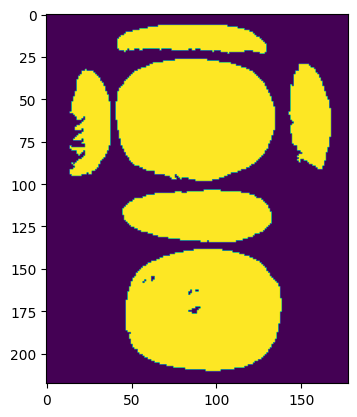

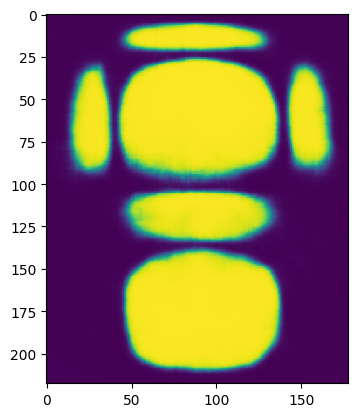

*****************************************************************************************************************
torch.Size([218, 178])


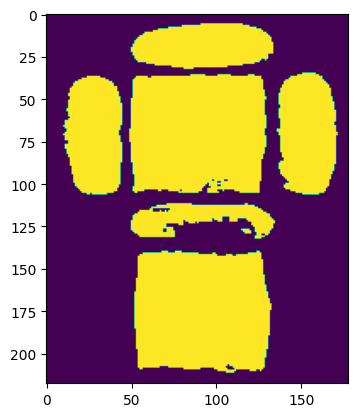

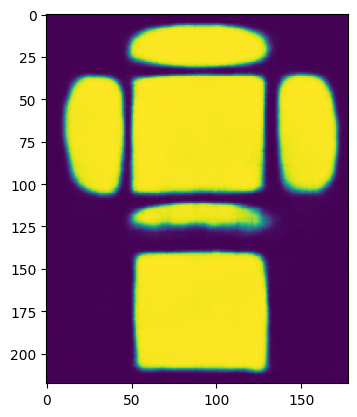

*****************************************************************************************************************
torch.Size([218, 178])


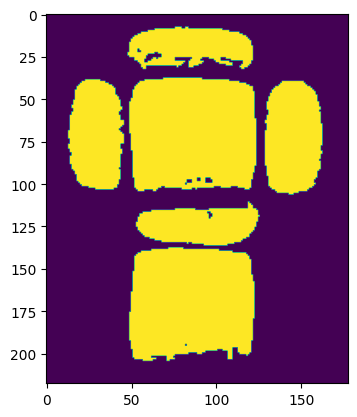

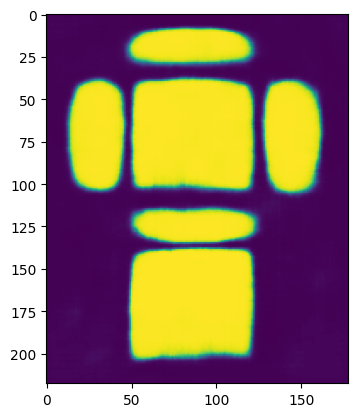

*****************************************************************************************************************
torch.Size([218, 178])


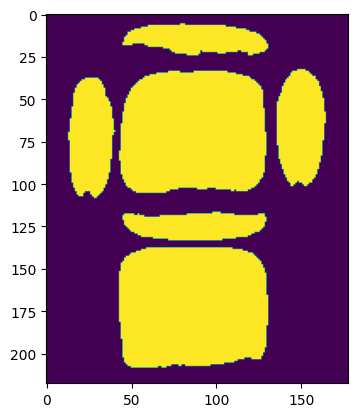

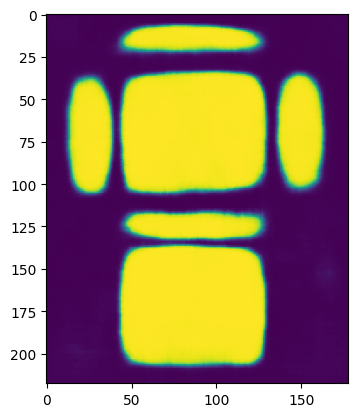

*****************************************************************************************************************
torch.Size([218, 178])


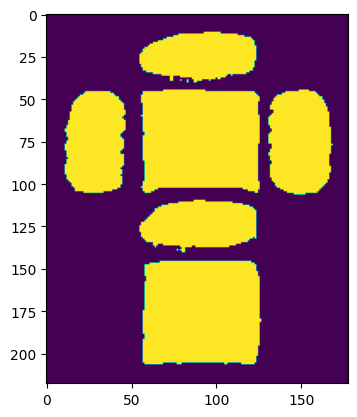

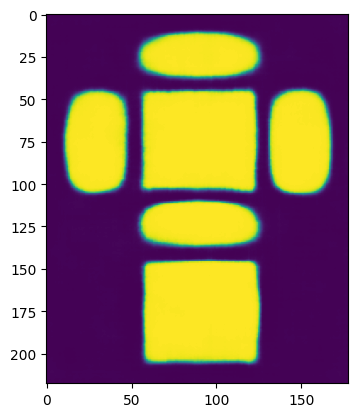

*****************************************************************************************************************
torch.Size([218, 178])


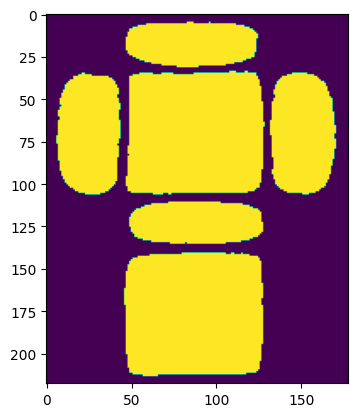

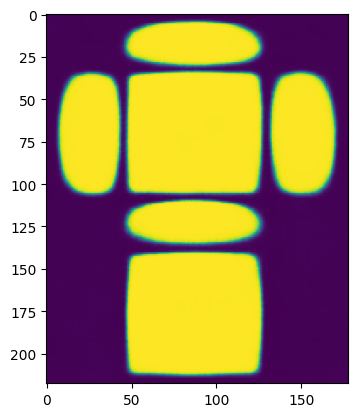

end of epoch 0
*****************************************************************************************************************
torch.Size([218, 178])


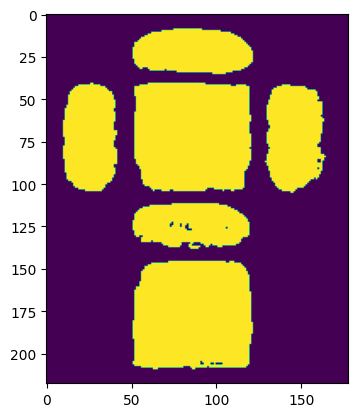

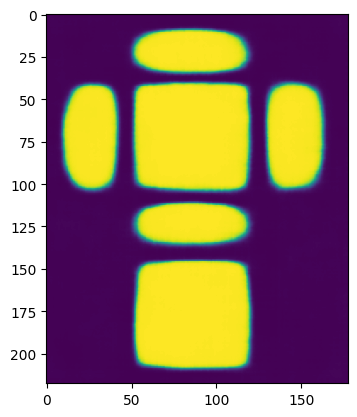

*****************************************************************************************************************
torch.Size([218, 178])


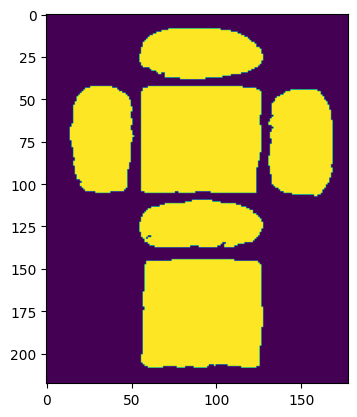

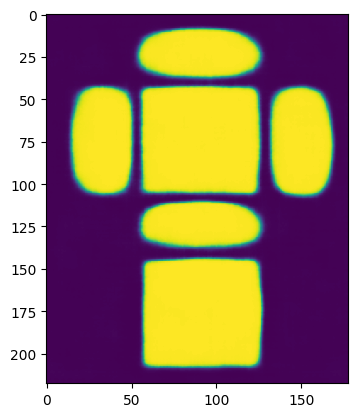

*****************************************************************************************************************
torch.Size([218, 178])


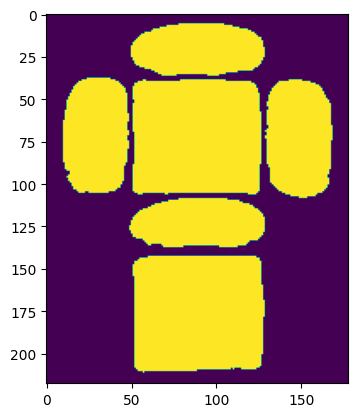

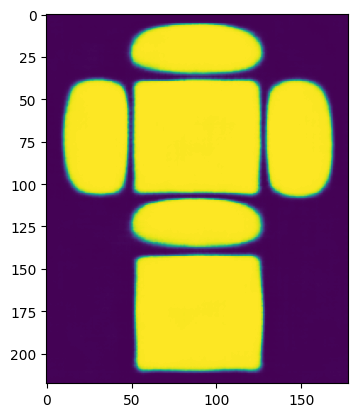

*****************************************************************************************************************
torch.Size([218, 178])


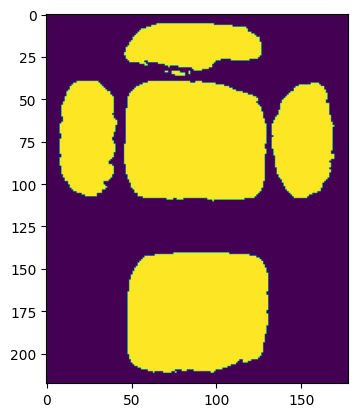

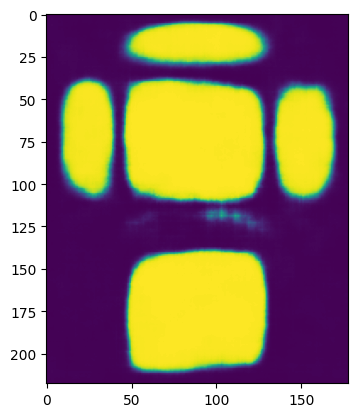

*****************************************************************************************************************
torch.Size([218, 178])


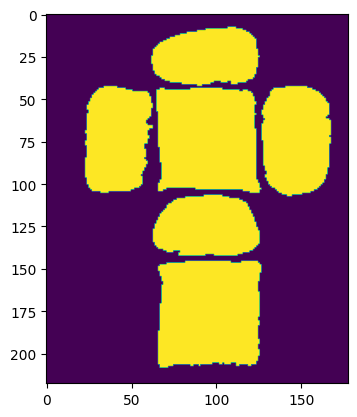

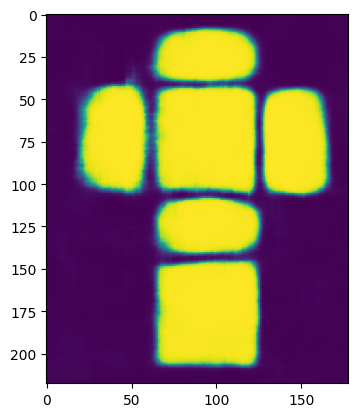

*****************************************************************************************************************
torch.Size([218, 178])


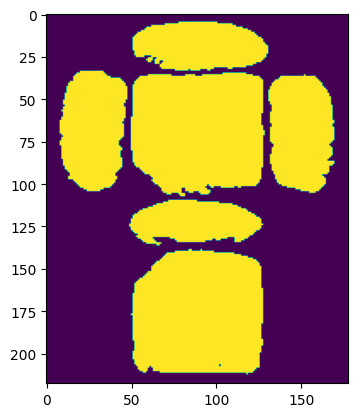

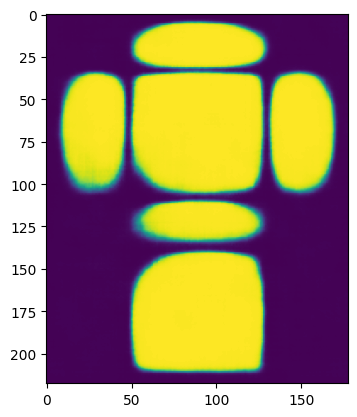

end of epoch 1
*****************************************************************************************************************
torch.Size([218, 178])


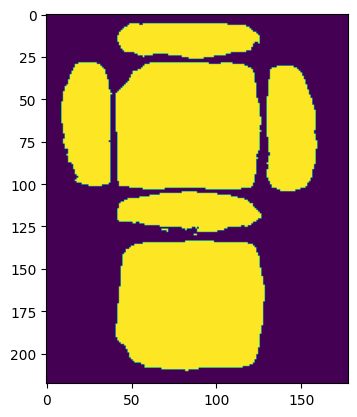

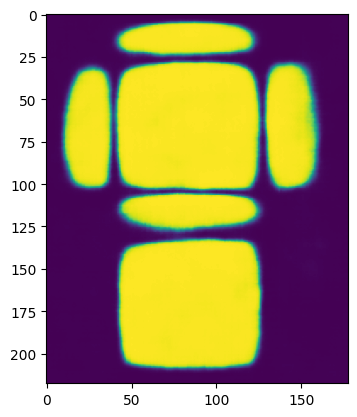

*****************************************************************************************************************
torch.Size([218, 178])


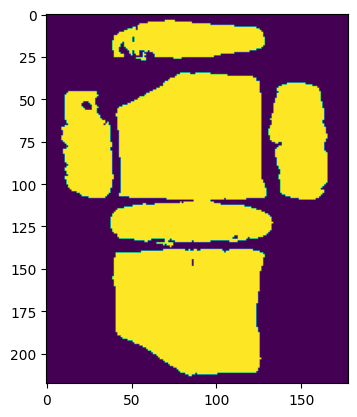

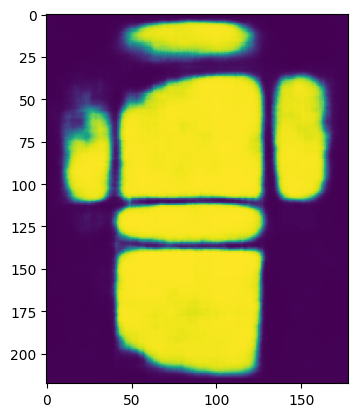

*****************************************************************************************************************
torch.Size([218, 178])


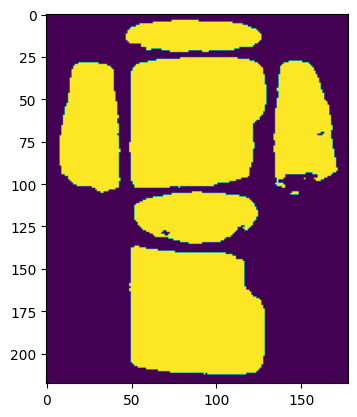

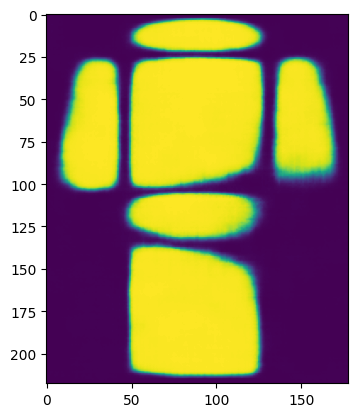

*****************************************************************************************************************
torch.Size([218, 178])


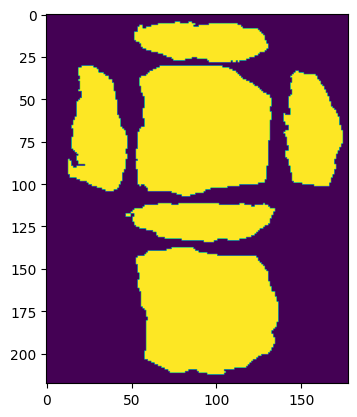

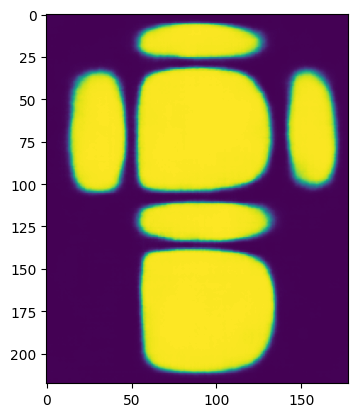

*****************************************************************************************************************
torch.Size([218, 178])


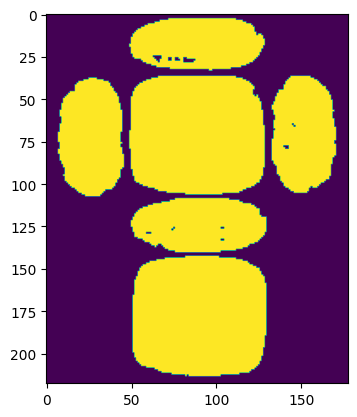

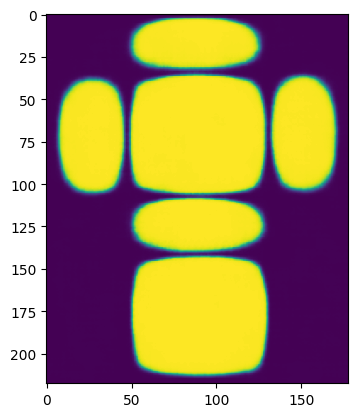

*****************************************************************************************************************
torch.Size([218, 178])


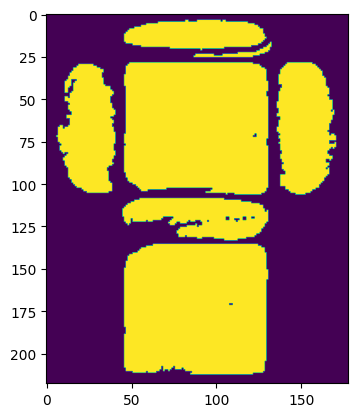

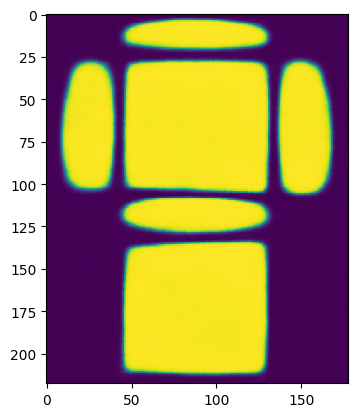

end of epoch 2
*****************************************************************************************************************
torch.Size([218, 178])


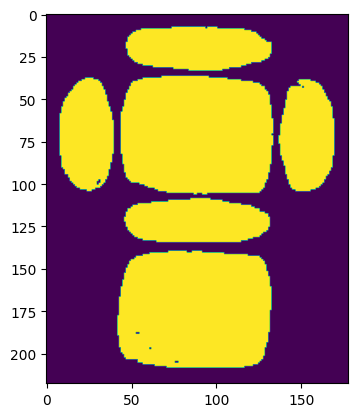

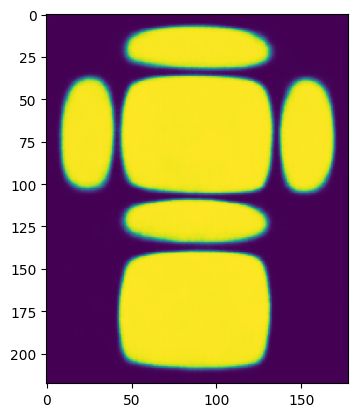

*****************************************************************************************************************
torch.Size([218, 178])


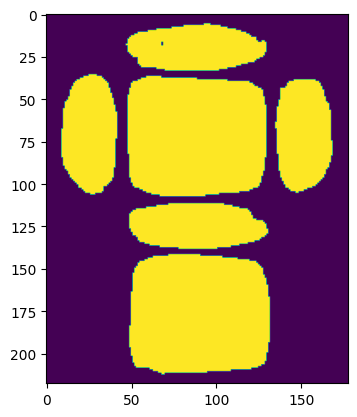

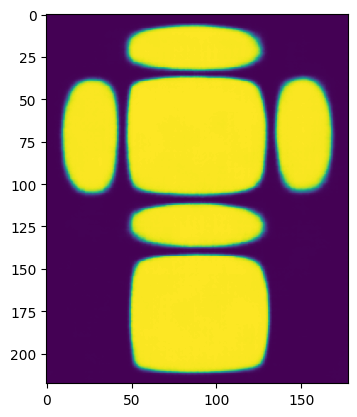

*****************************************************************************************************************
torch.Size([218, 178])


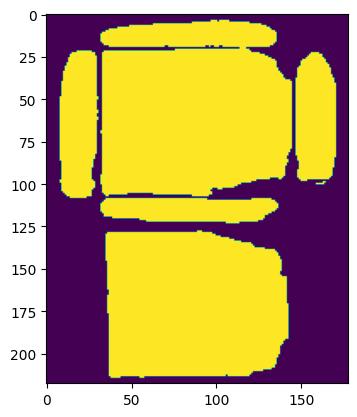

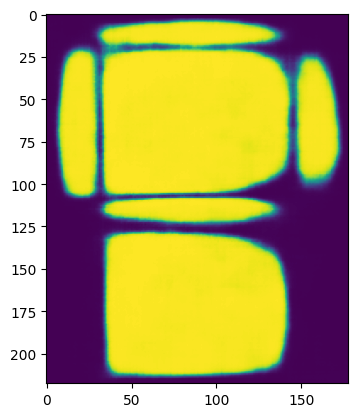

*****************************************************************************************************************
torch.Size([218, 178])


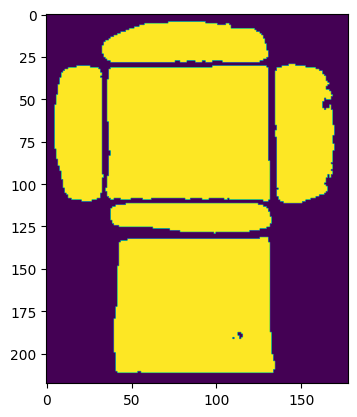

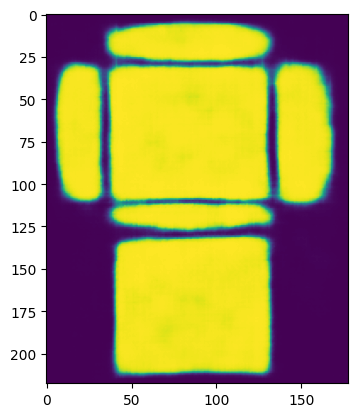

*****************************************************************************************************************
torch.Size([218, 178])


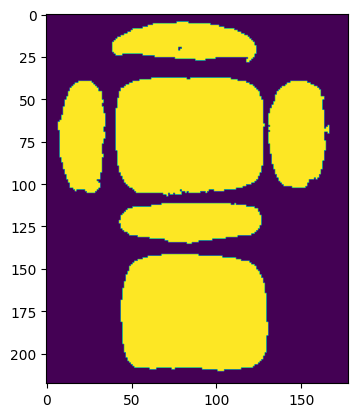

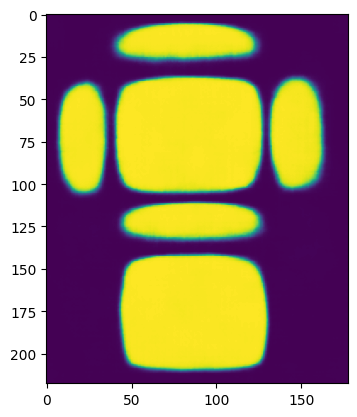

*****************************************************************************************************************
torch.Size([218, 178])


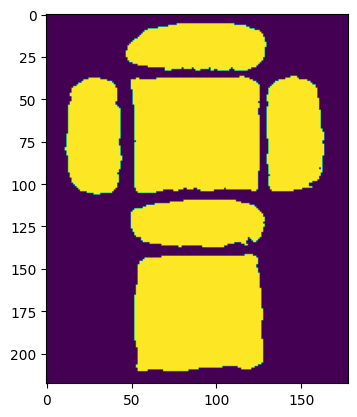

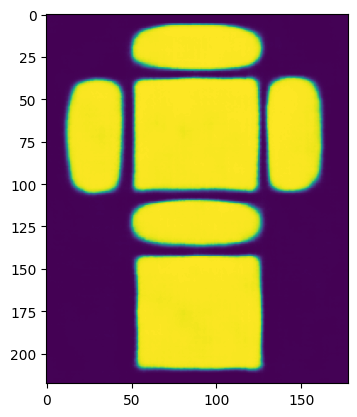

end of epoch 3
*****************************************************************************************************************
torch.Size([218, 178])


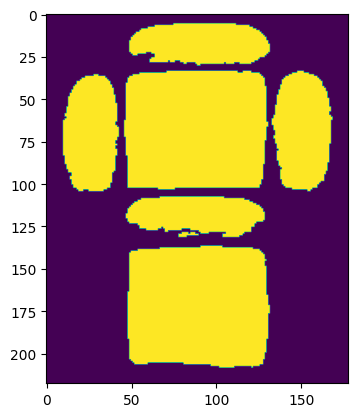

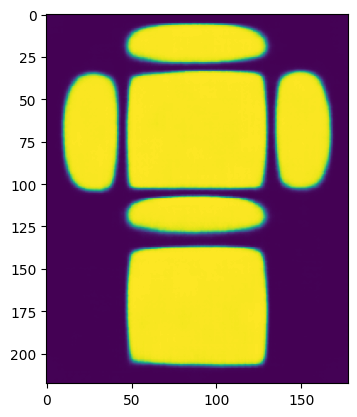

*****************************************************************************************************************
torch.Size([218, 178])


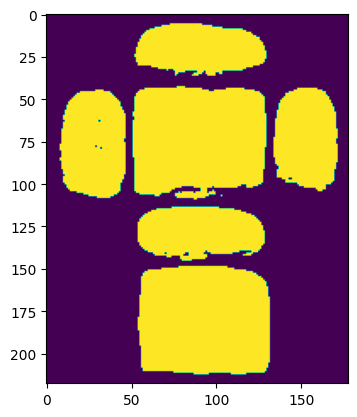

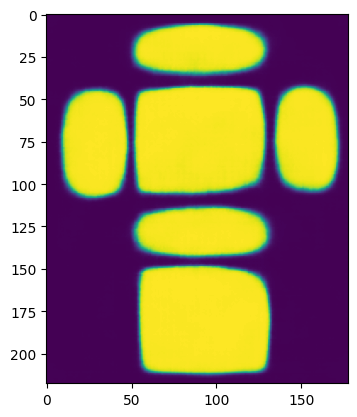

*****************************************************************************************************************
torch.Size([218, 178])


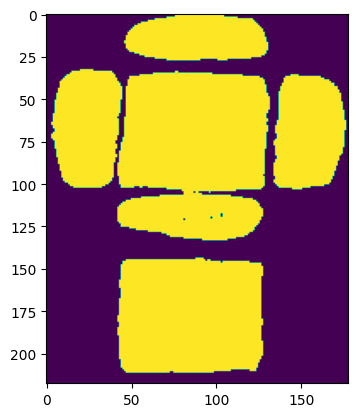

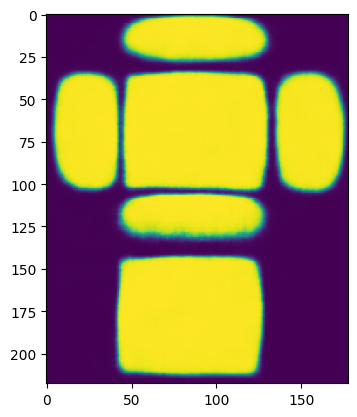

*****************************************************************************************************************
torch.Size([218, 178])


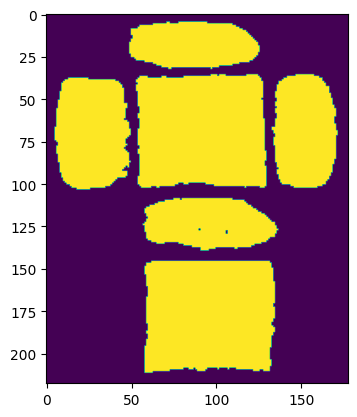

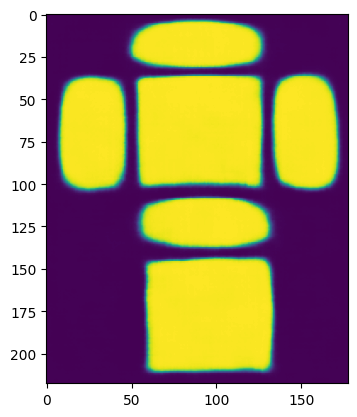

*****************************************************************************************************************
torch.Size([218, 178])


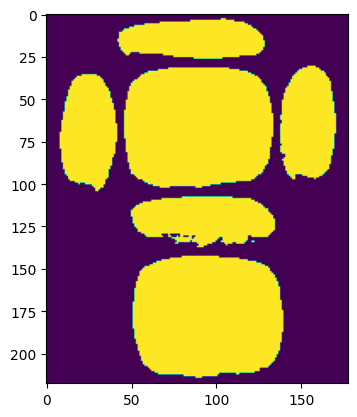

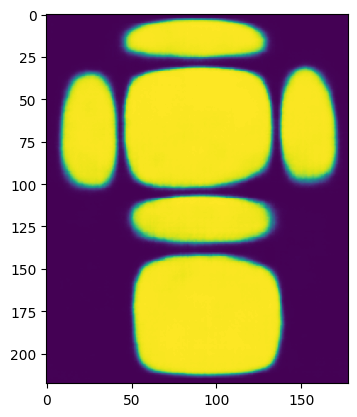

*****************************************************************************************************************
torch.Size([218, 178])


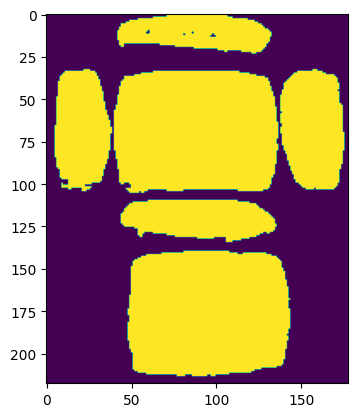

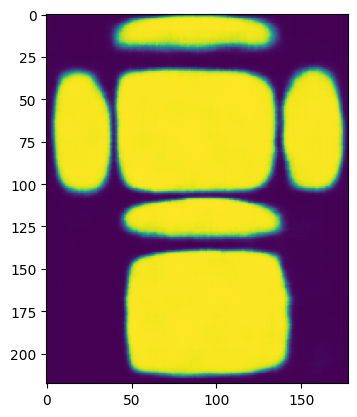

end of epoch 4
*****************************************************************************************************************
torch.Size([218, 178])


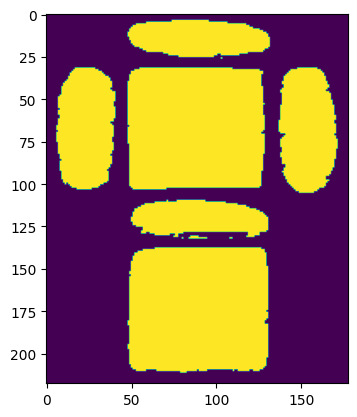

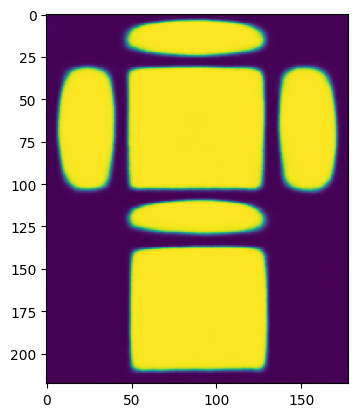

*****************************************************************************************************************
torch.Size([218, 178])


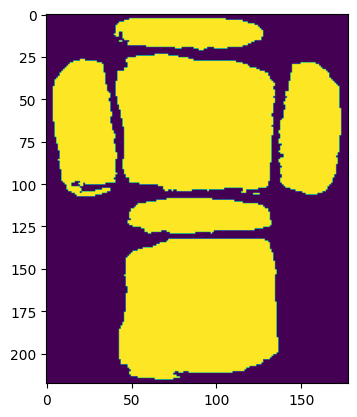

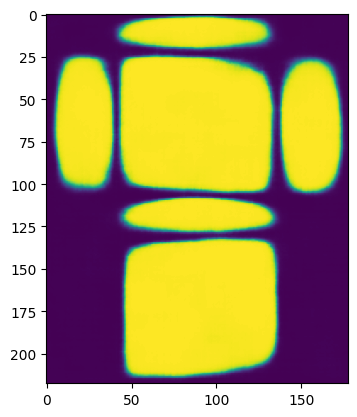

*****************************************************************************************************************
torch.Size([218, 178])


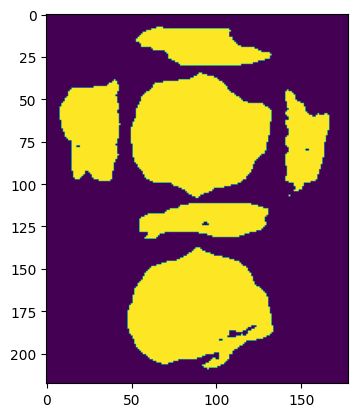

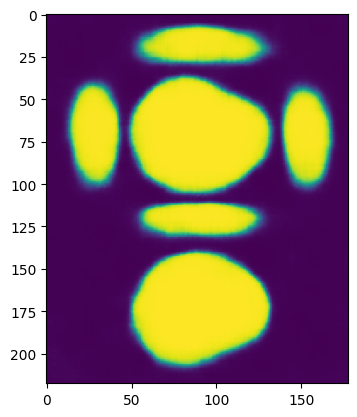

*****************************************************************************************************************
torch.Size([218, 178])


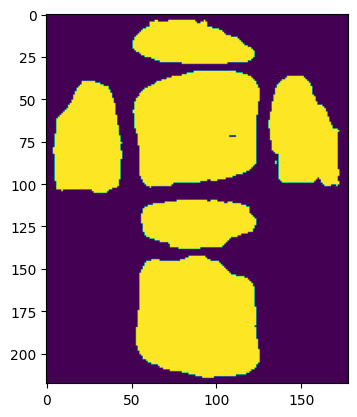

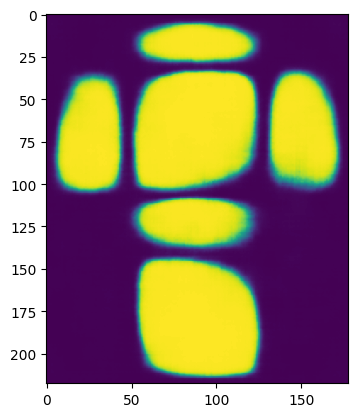

*****************************************************************************************************************
torch.Size([218, 178])


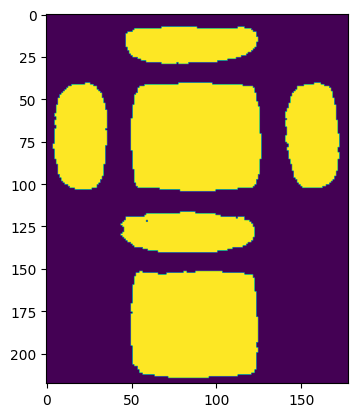

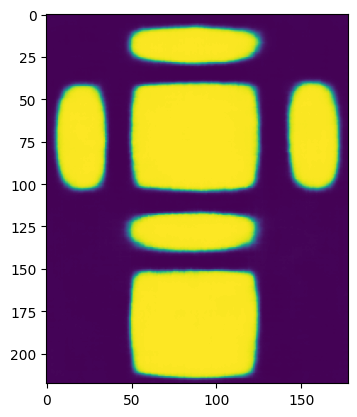

*****************************************************************************************************************
torch.Size([218, 178])


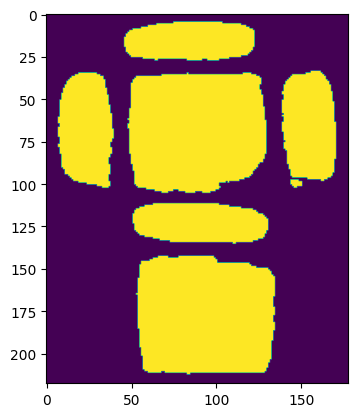

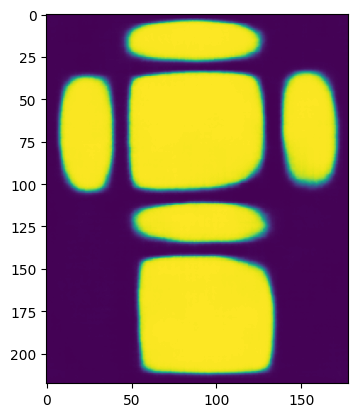

end of epoch 5
*****************************************************************************************************************
torch.Size([218, 178])


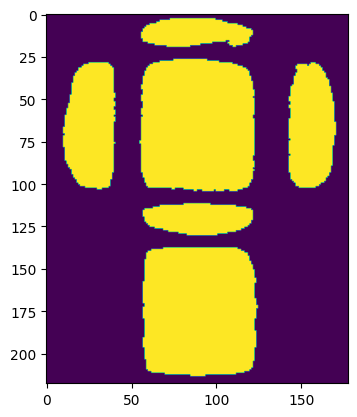

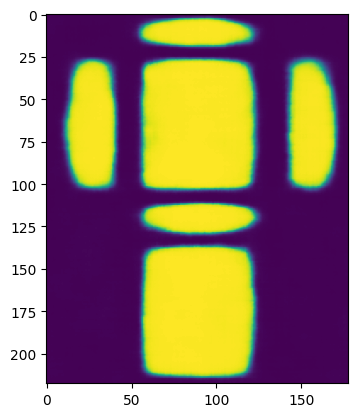

*****************************************************************************************************************
torch.Size([218, 178])


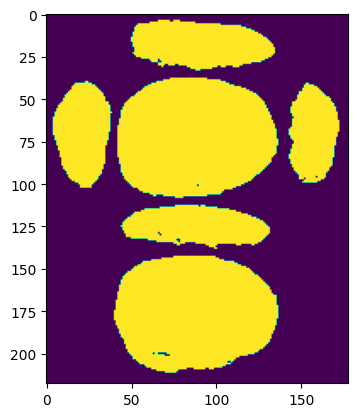

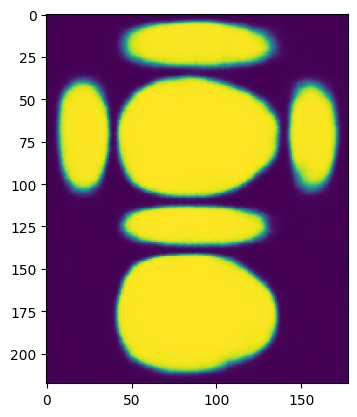

*****************************************************************************************************************
torch.Size([218, 178])


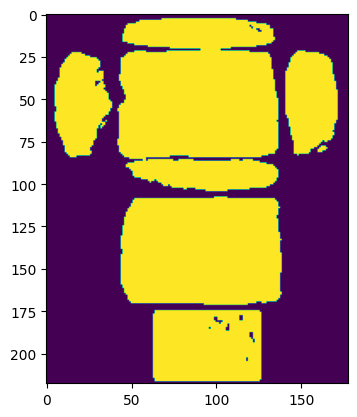

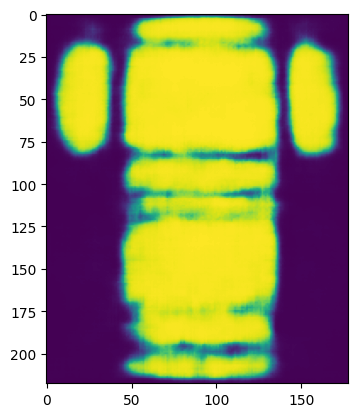

*****************************************************************************************************************
torch.Size([218, 178])


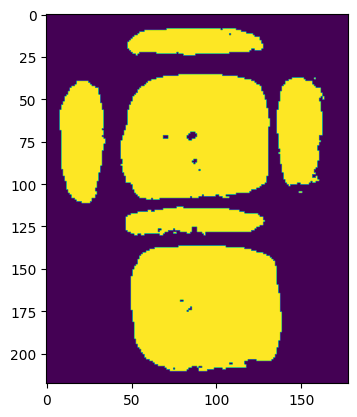

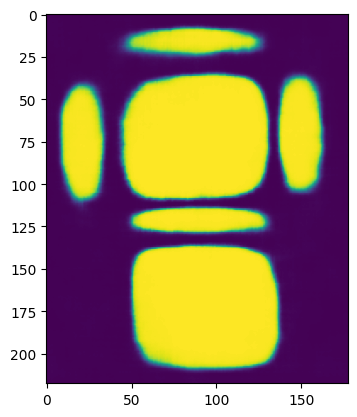

*****************************************************************************************************************
torch.Size([218, 178])


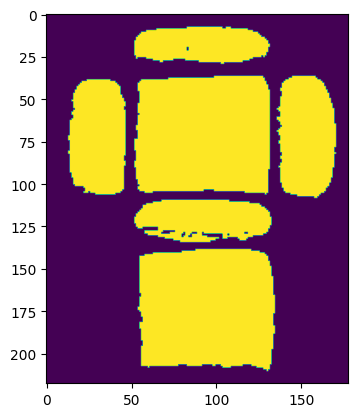

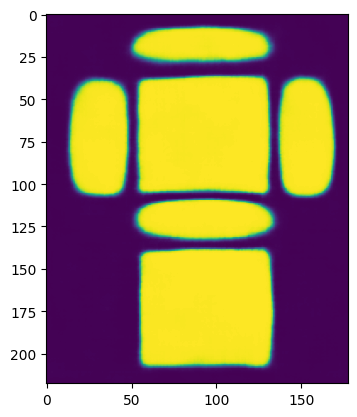

*****************************************************************************************************************
torch.Size([218, 178])


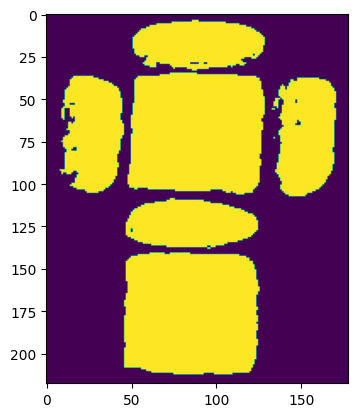

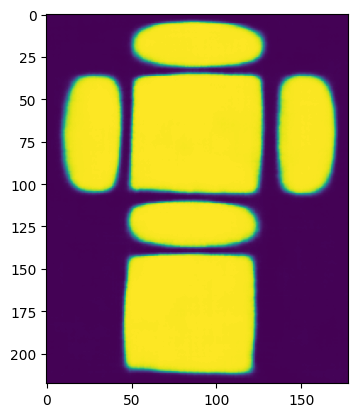

end of epoch 6
*****************************************************************************************************************
torch.Size([218, 178])


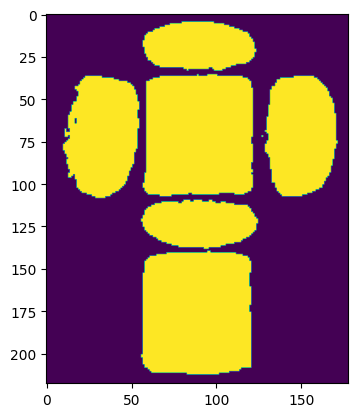

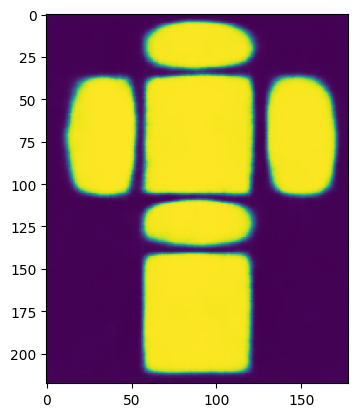

*****************************************************************************************************************
torch.Size([218, 178])


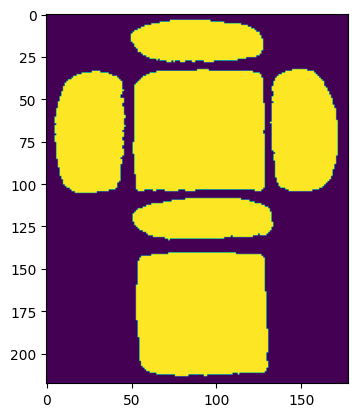

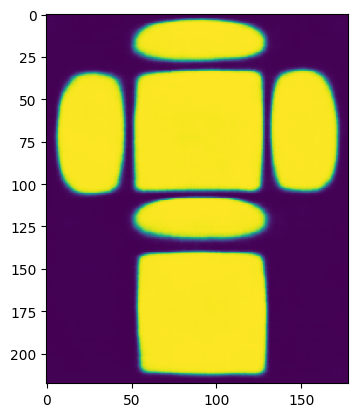

*****************************************************************************************************************
torch.Size([218, 178])


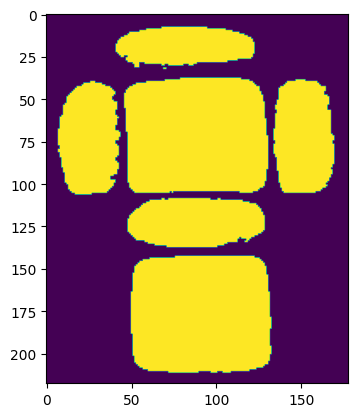

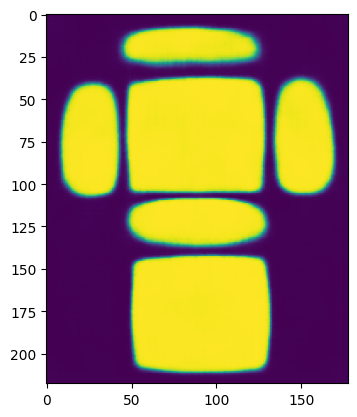

*****************************************************************************************************************
torch.Size([218, 178])


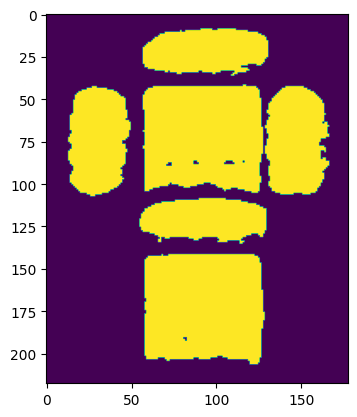

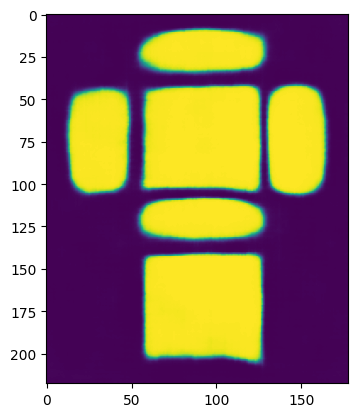

*****************************************************************************************************************
torch.Size([218, 178])


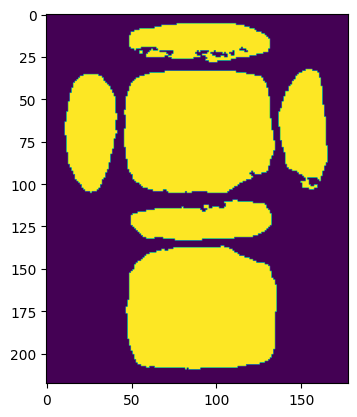

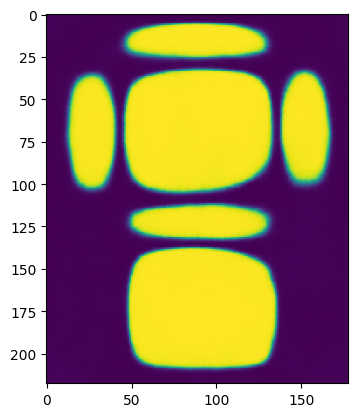

*****************************************************************************************************************
torch.Size([218, 178])


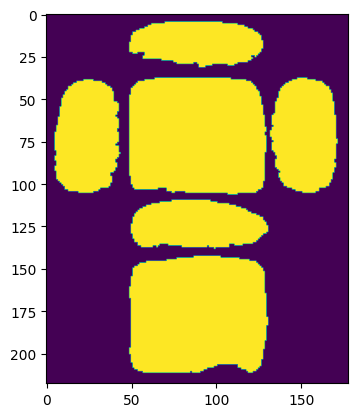

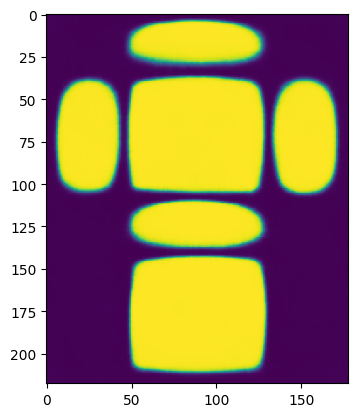

end of epoch 7
*****************************************************************************************************************
torch.Size([218, 178])


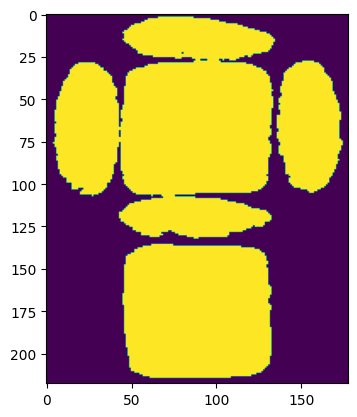

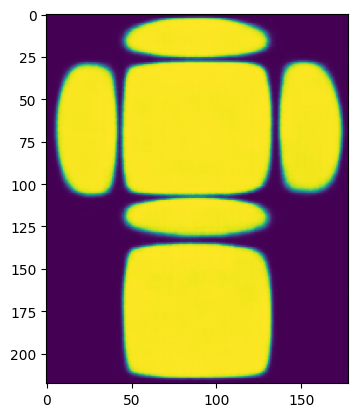

*****************************************************************************************************************
torch.Size([218, 178])


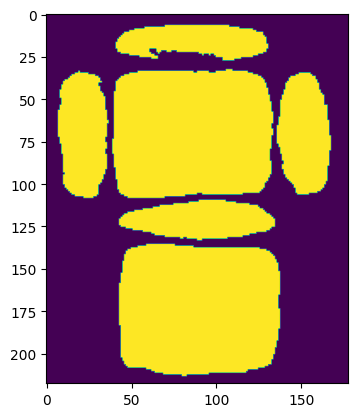

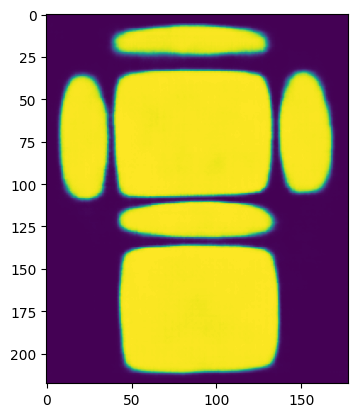

*****************************************************************************************************************
torch.Size([218, 178])


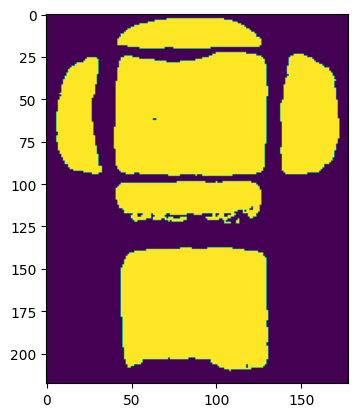

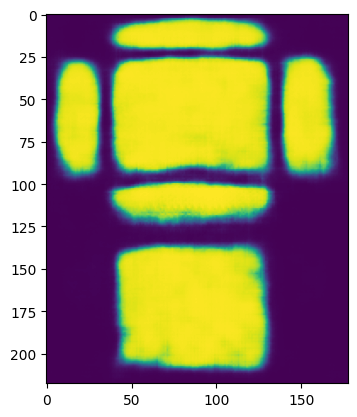

*****************************************************************************************************************
torch.Size([218, 178])


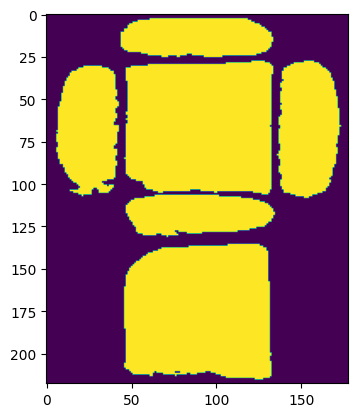

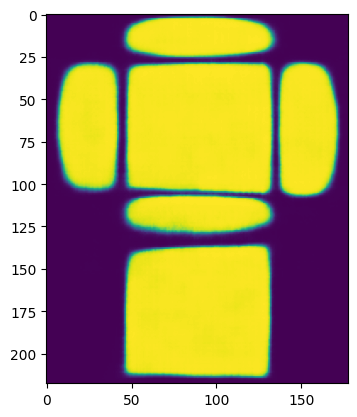

*****************************************************************************************************************
torch.Size([218, 178])


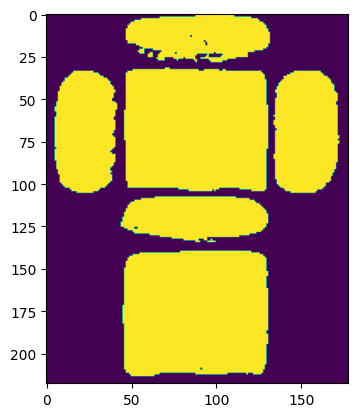

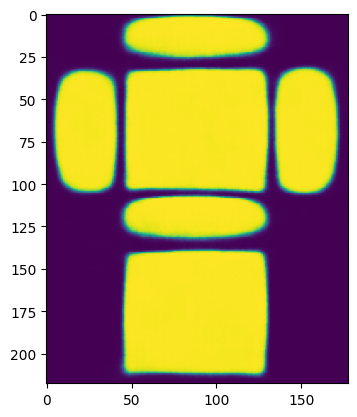

*****************************************************************************************************************
torch.Size([218, 178])


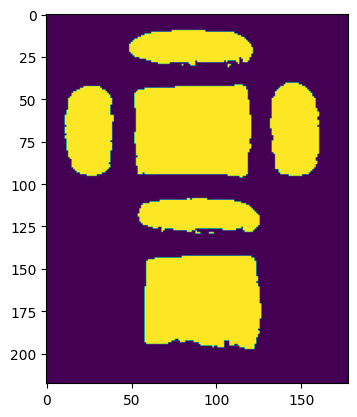

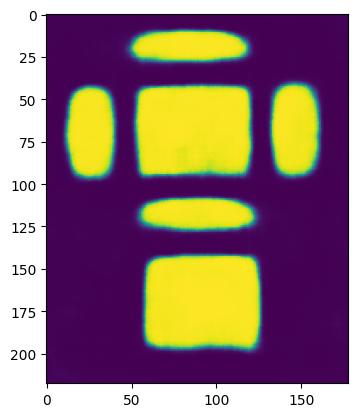

end of epoch 8
*****************************************************************************************************************
torch.Size([218, 178])


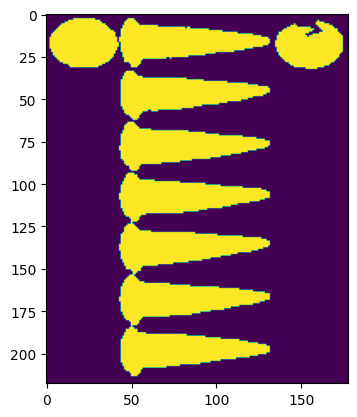

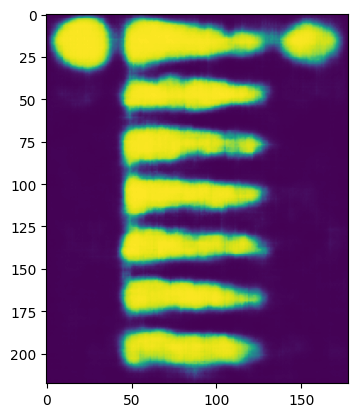

*****************************************************************************************************************
torch.Size([218, 178])


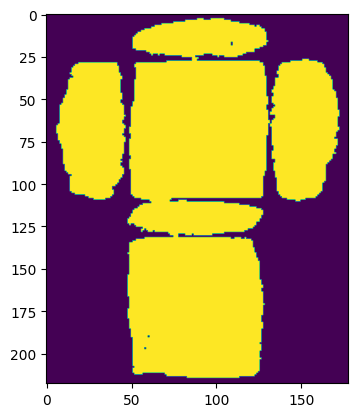

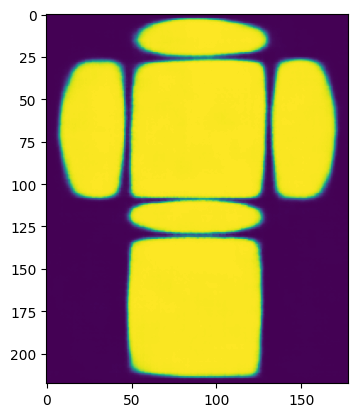

*****************************************************************************************************************
torch.Size([218, 178])


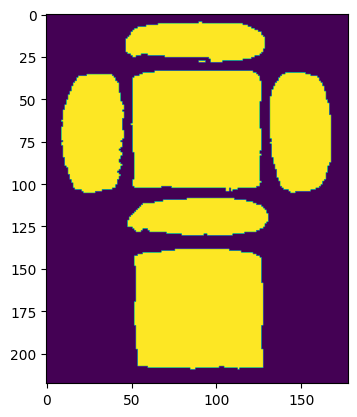

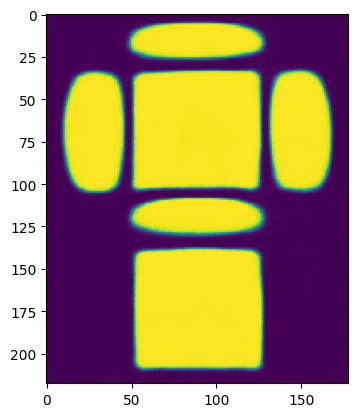

*****************************************************************************************************************
torch.Size([218, 178])


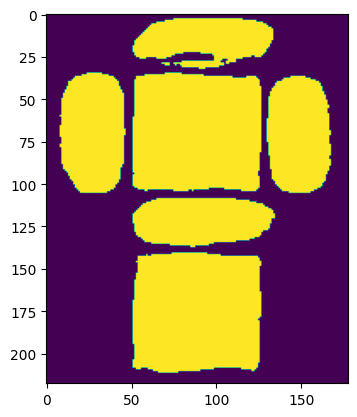

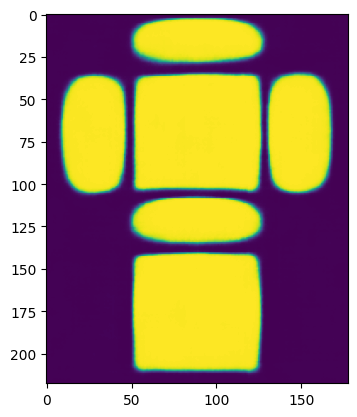

*****************************************************************************************************************
torch.Size([218, 178])


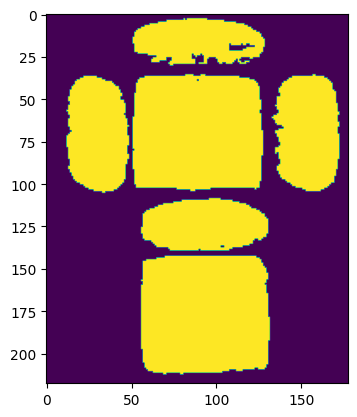

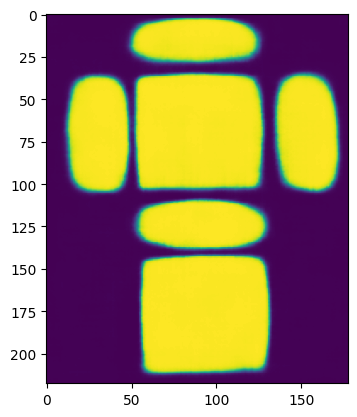

*****************************************************************************************************************
torch.Size([218, 178])


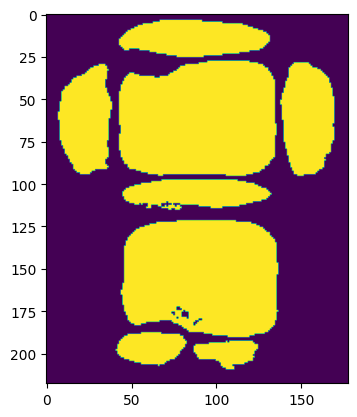

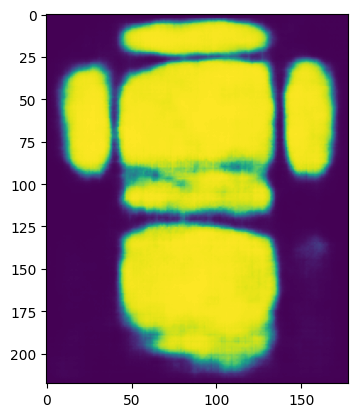

end of epoch 9
*****************************************************************************************************************
torch.Size([218, 178])


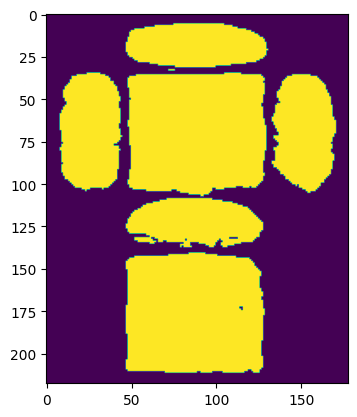

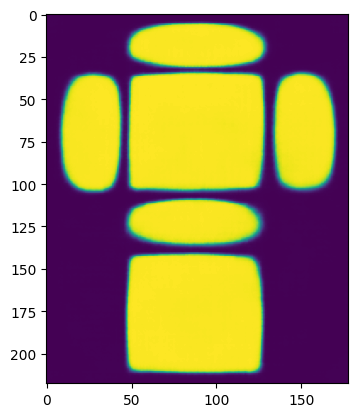

*****************************************************************************************************************
torch.Size([218, 178])


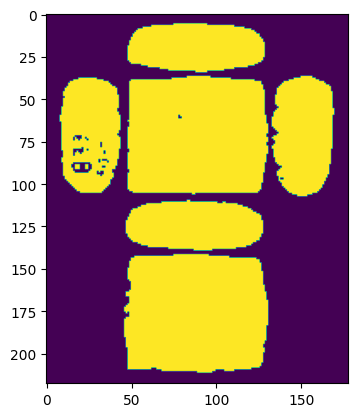

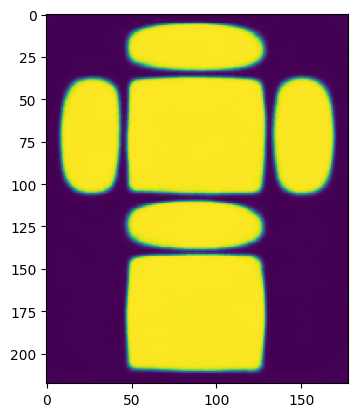

*****************************************************************************************************************
torch.Size([218, 178])


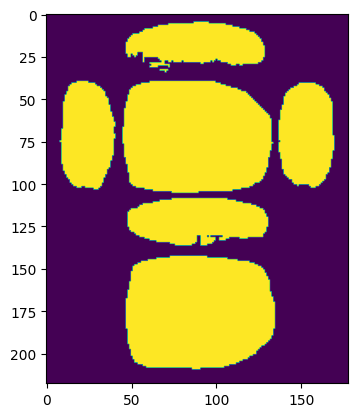

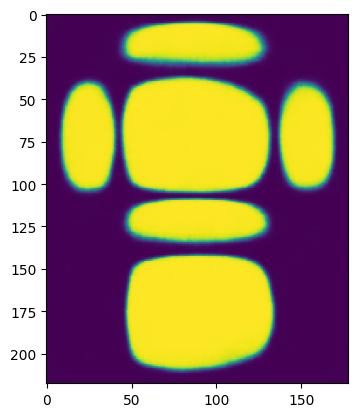

*****************************************************************************************************************
torch.Size([218, 178])


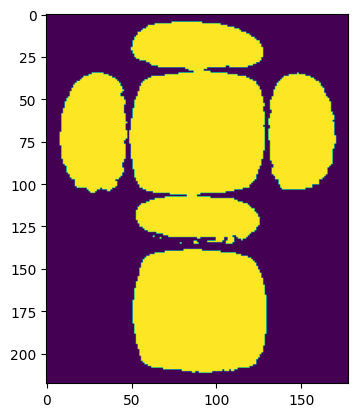

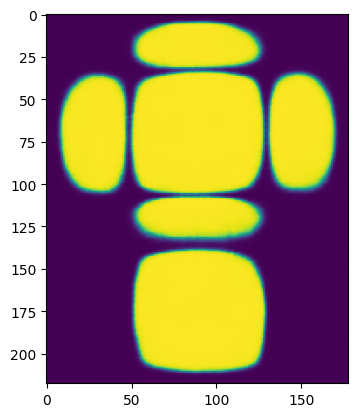

*****************************************************************************************************************
torch.Size([218, 178])


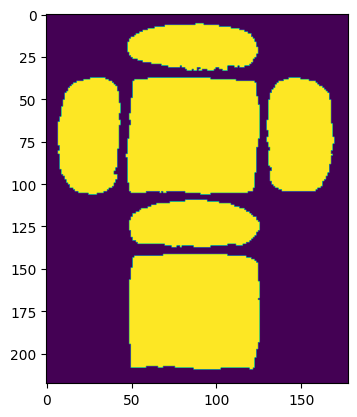

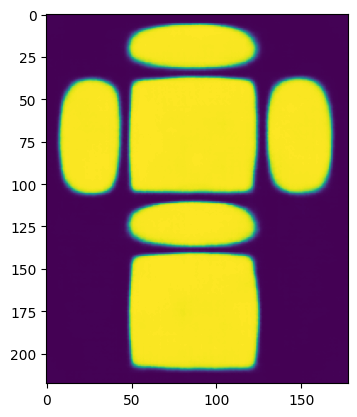

*****************************************************************************************************************
torch.Size([218, 178])


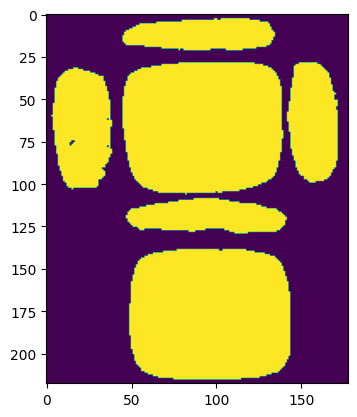

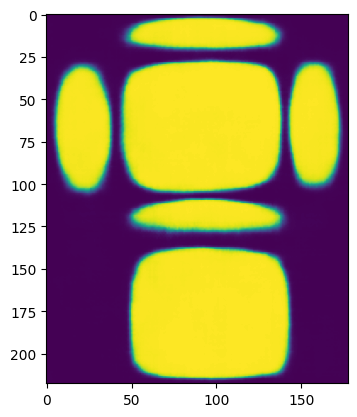

end of epoch 10
*****************************************************************************************************************
torch.Size([218, 178])


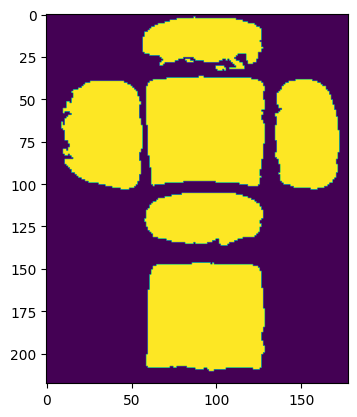

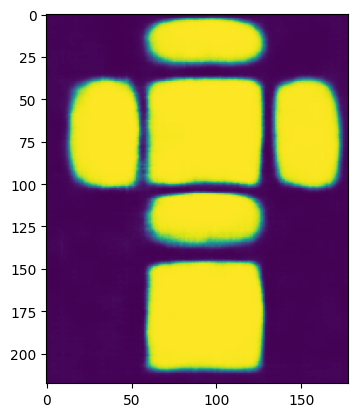

*****************************************************************************************************************
torch.Size([218, 178])


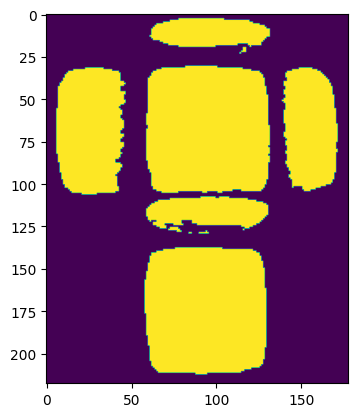

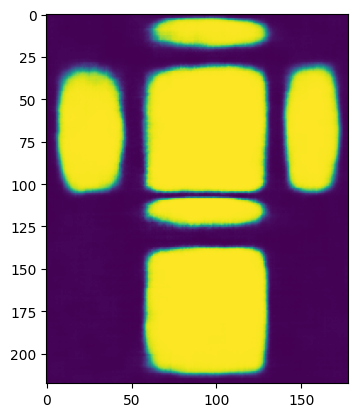

*****************************************************************************************************************
torch.Size([218, 178])


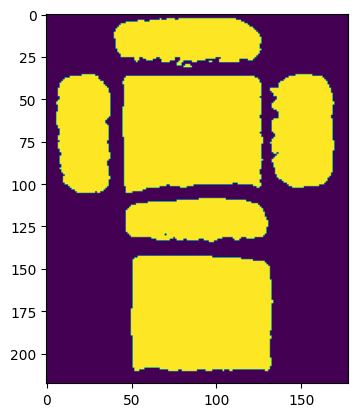

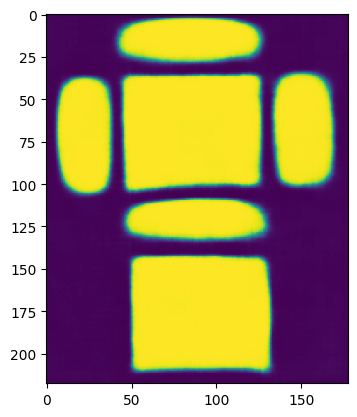

*****************************************************************************************************************
torch.Size([218, 178])


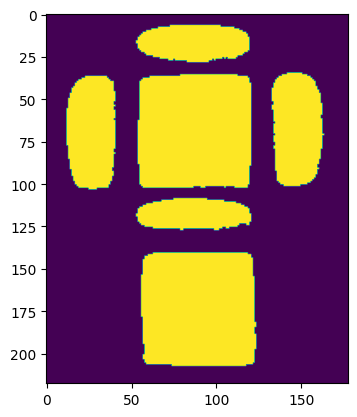

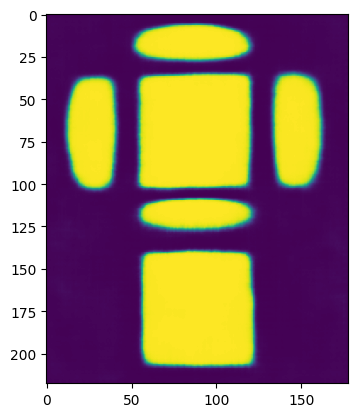

*****************************************************************************************************************
torch.Size([218, 178])


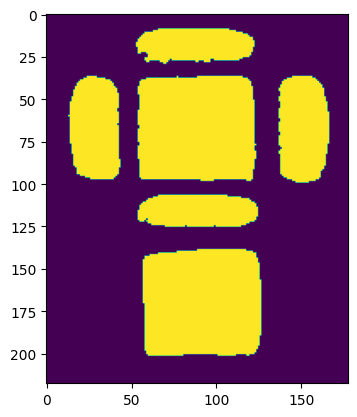

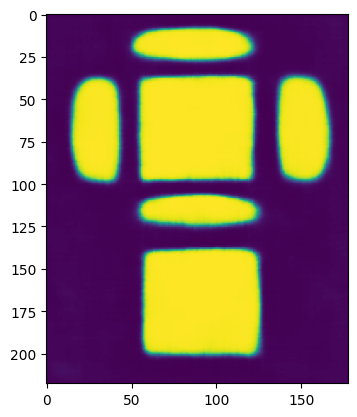

*****************************************************************************************************************
torch.Size([218, 178])


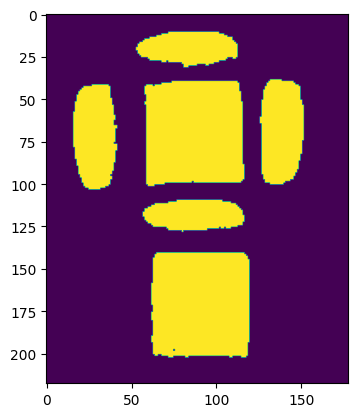

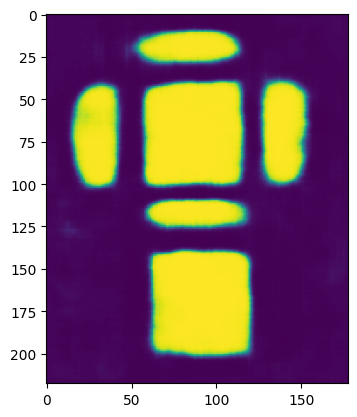

end of epoch 11
*****************************************************************************************************************
torch.Size([218, 178])


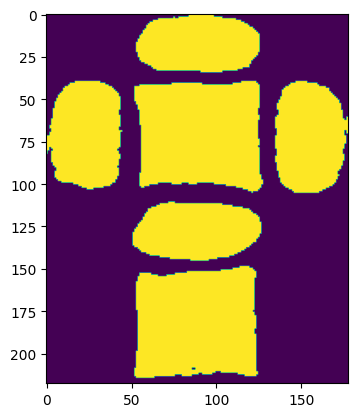

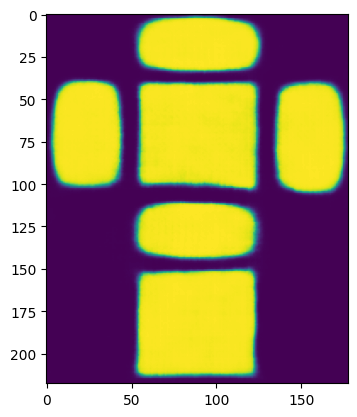

*****************************************************************************************************************
torch.Size([218, 178])


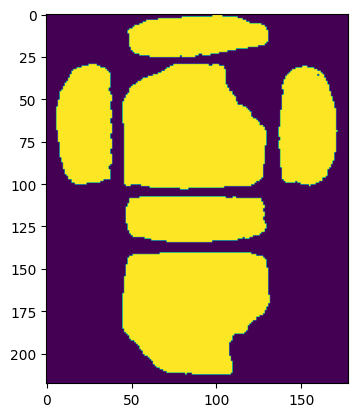

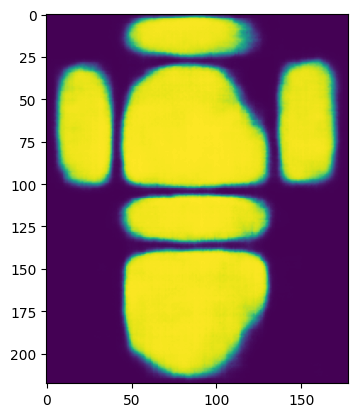

*****************************************************************************************************************
torch.Size([218, 178])


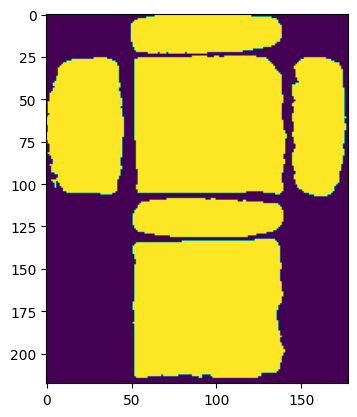

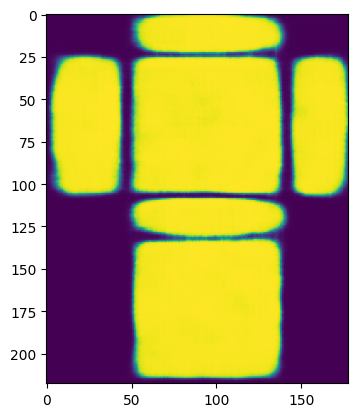

*****************************************************************************************************************
torch.Size([218, 178])


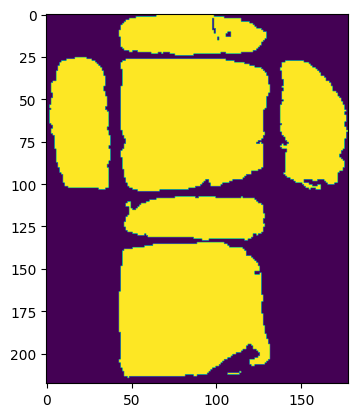

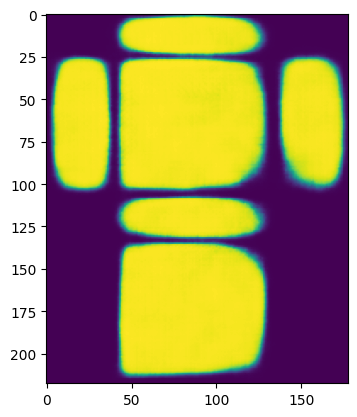

*****************************************************************************************************************
torch.Size([218, 178])


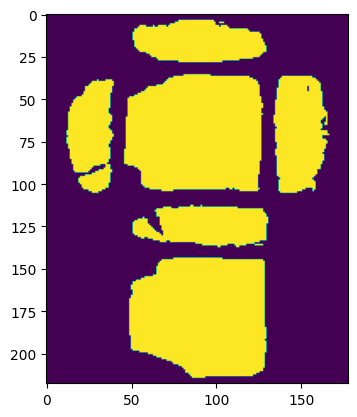

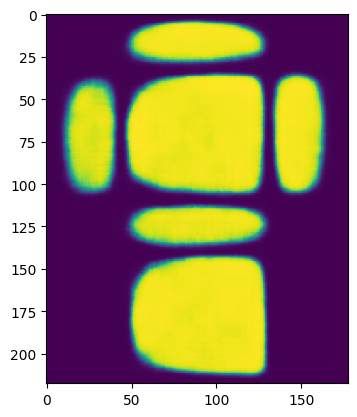

*****************************************************************************************************************
torch.Size([218, 178])


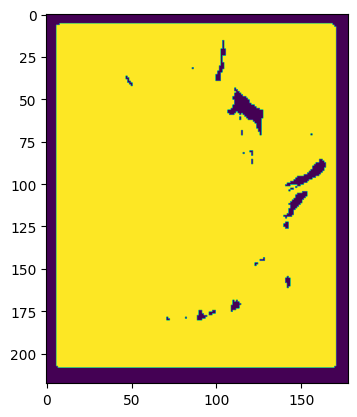

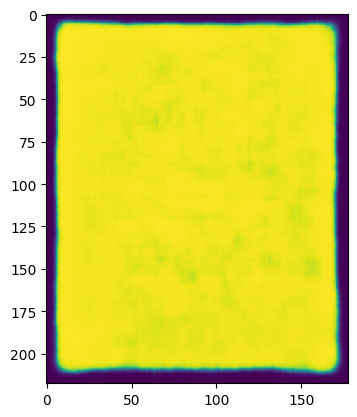

end of epoch 12
*****************************************************************************************************************
torch.Size([218, 178])


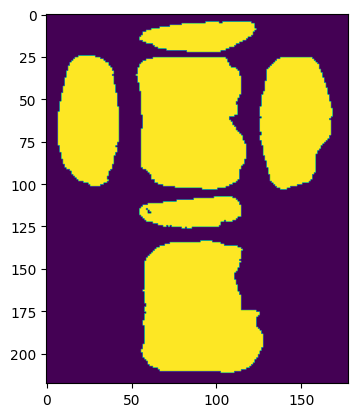

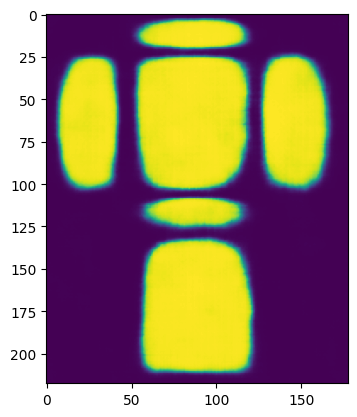

*****************************************************************************************************************
torch.Size([218, 178])


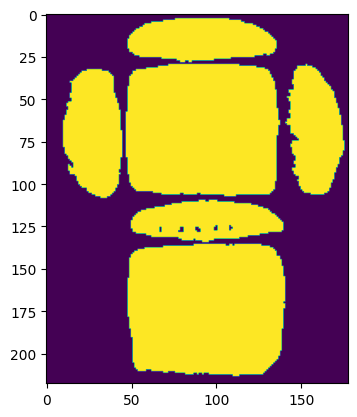

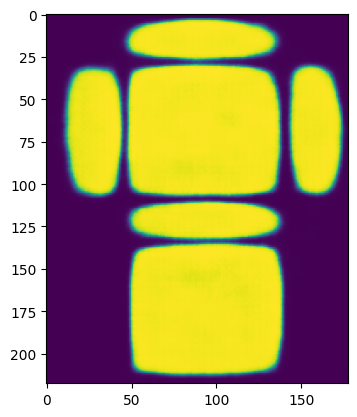

*****************************************************************************************************************
torch.Size([218, 178])


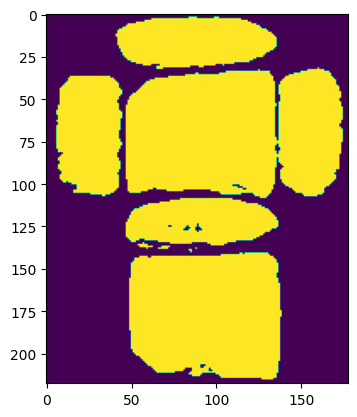

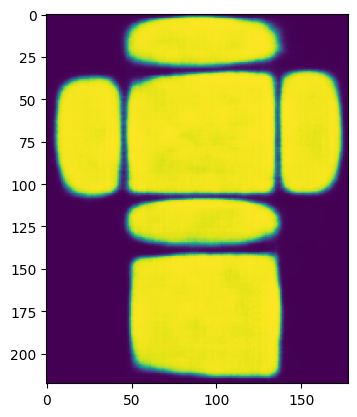

*****************************************************************************************************************
torch.Size([218, 178])


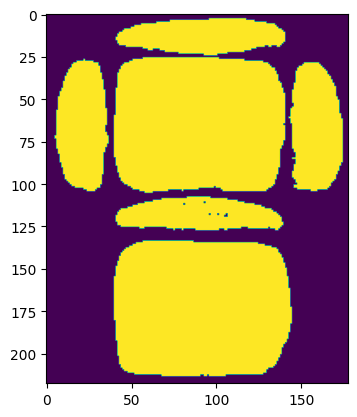

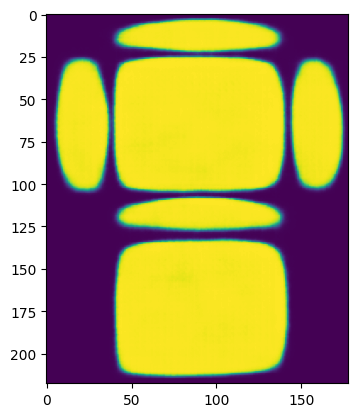

*****************************************************************************************************************
torch.Size([218, 178])


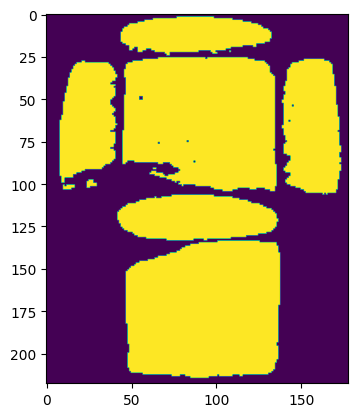

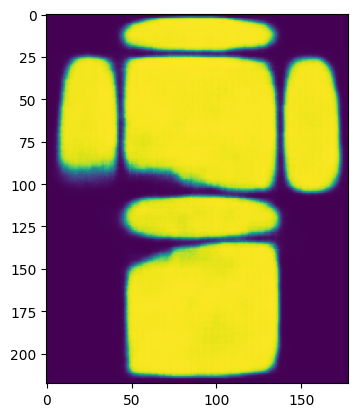

*****************************************************************************************************************
torch.Size([218, 178])


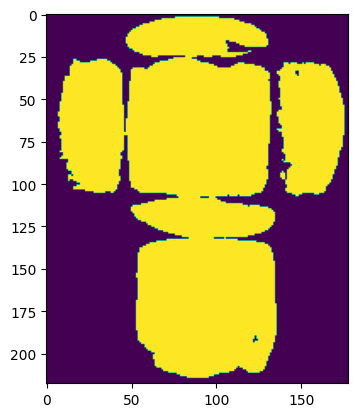

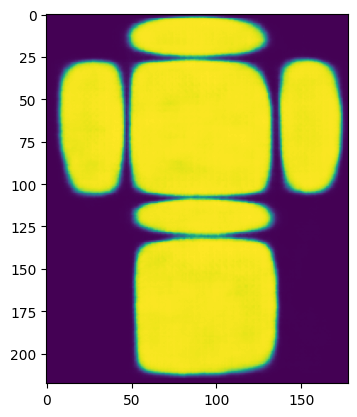

end of epoch 13
*****************************************************************************************************************
torch.Size([218, 178])


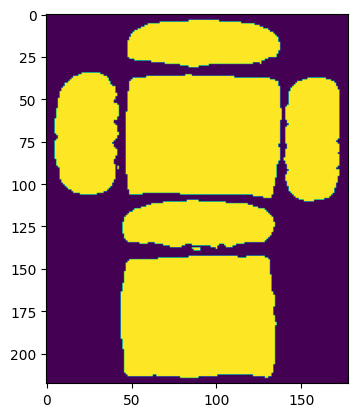

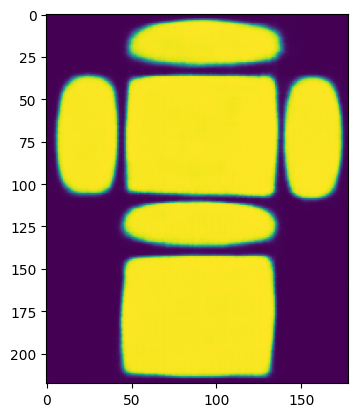

*****************************************************************************************************************
torch.Size([218, 178])


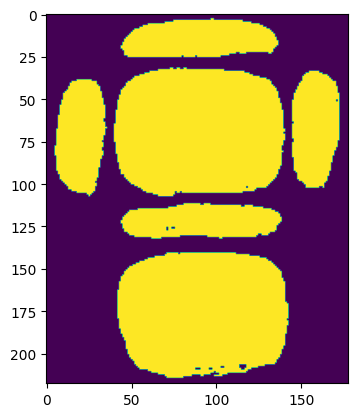

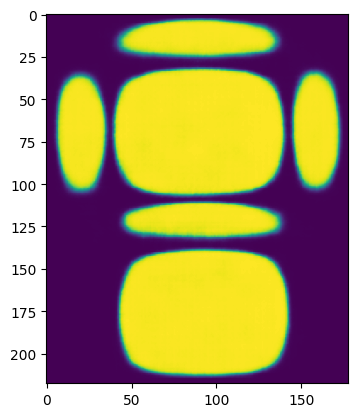

*****************************************************************************************************************
torch.Size([218, 178])


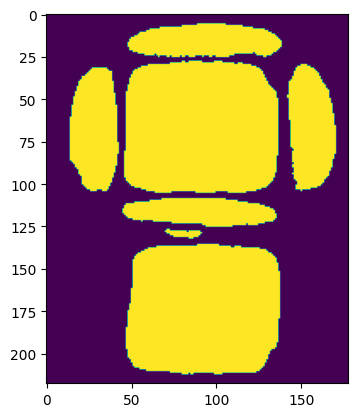

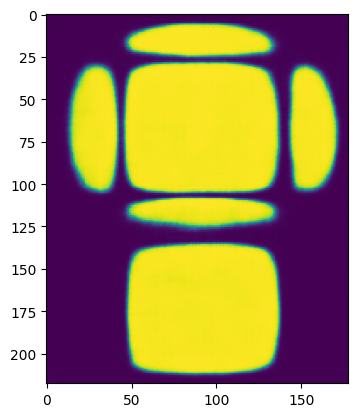

*****************************************************************************************************************
torch.Size([218, 178])


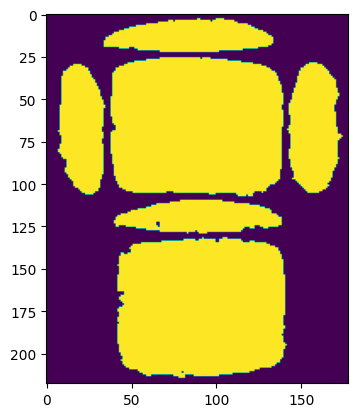

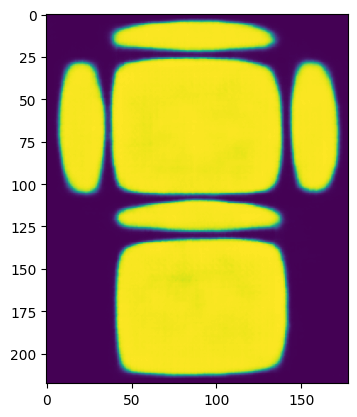

*****************************************************************************************************************
torch.Size([218, 178])


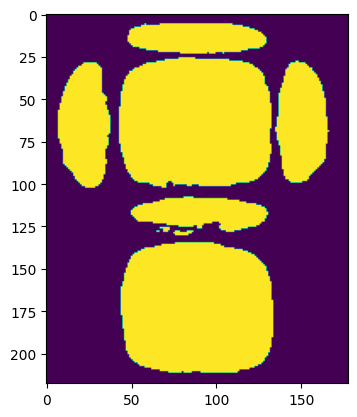

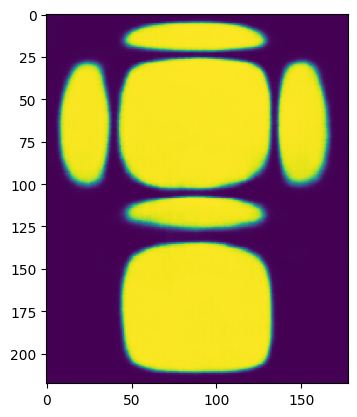

*****************************************************************************************************************
torch.Size([218, 178])


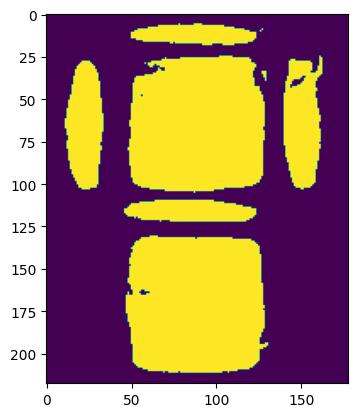

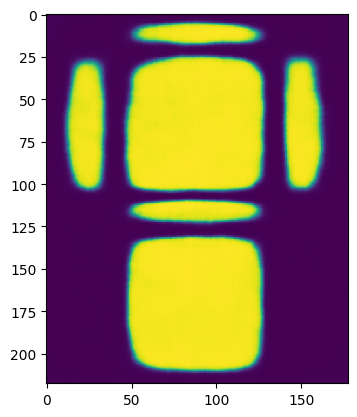

end of epoch 14
*****************************************************************************************************************
torch.Size([218, 178])


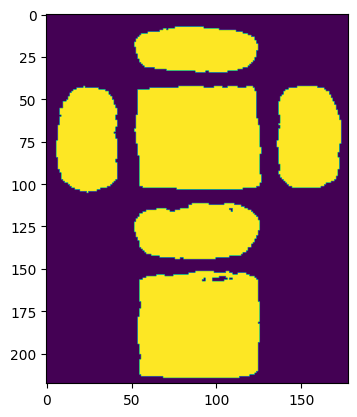

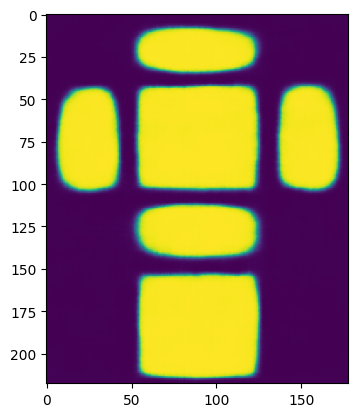

*****************************************************************************************************************
torch.Size([218, 178])


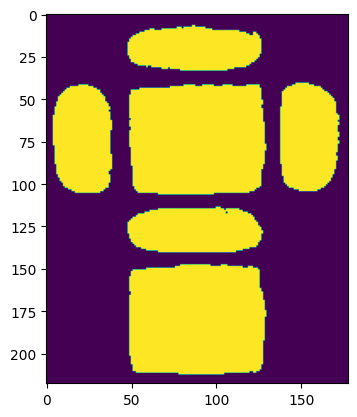

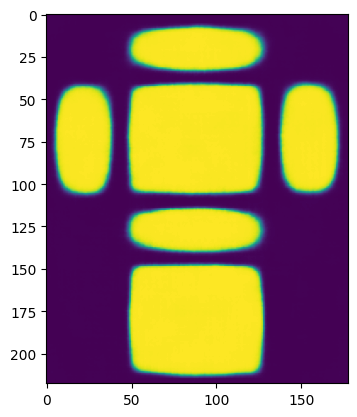

*****************************************************************************************************************
torch.Size([218, 178])


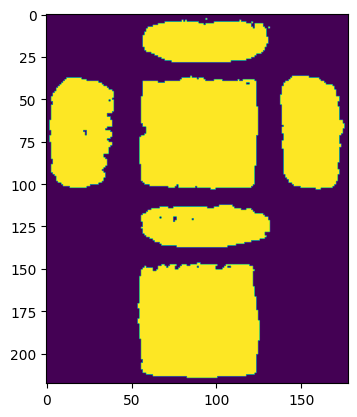

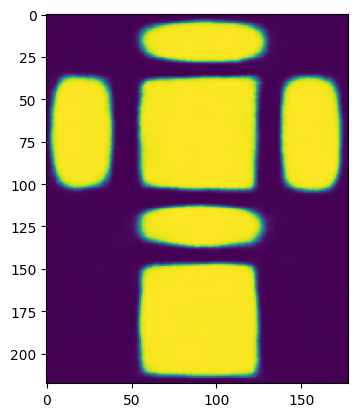

*****************************************************************************************************************
torch.Size([218, 178])


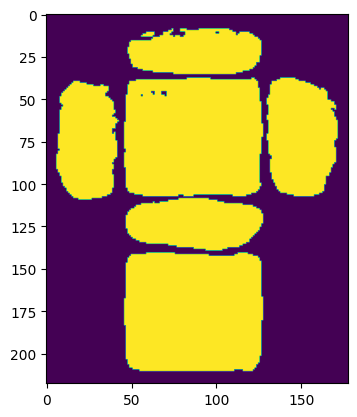

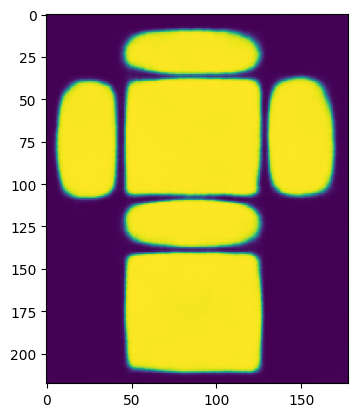

*****************************************************************************************************************
torch.Size([218, 178])


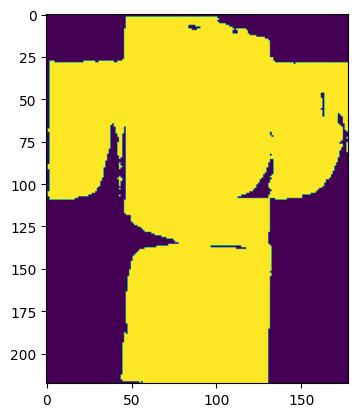

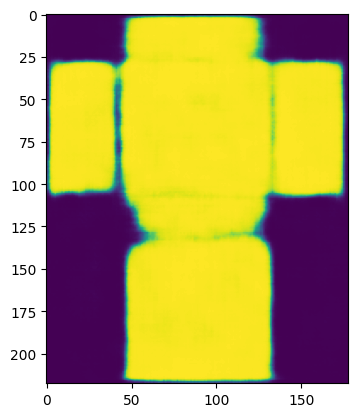

*****************************************************************************************************************
torch.Size([218, 178])


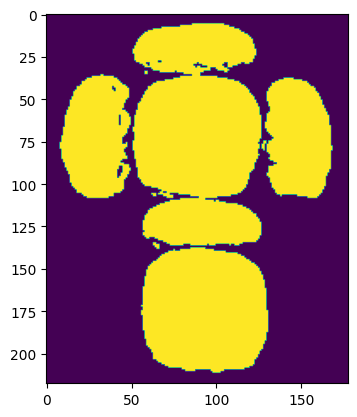

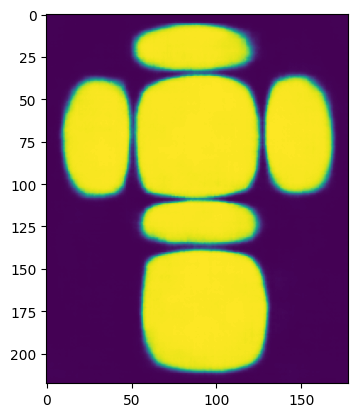

end of epoch 15


In [27]:
# test:
import matplotlib.pyplot as plt
count = 0
for i, batch in enumerate(dl_test):
    
    for count in range (1, 7):
        print("*****************************************************************************************************************")
        x,y = batch
        plt.imshow(  x[count].permute(1, 2, 0)  )
        plt.figure()
        z = model_resume(x)

        plt.imshow(z[0][count][0].detach())    
        print(z[0][count][0].shape)
        plt.show()
    print("end of epoch "+str(i))
    if i==15:
        break